In [13]:
import fwiVis.fwiVis as fv #somehow not including updates to code? 

import s3fs
s3 = s3fs.S3FileSystem(anon=False)
from math import cos, asin, sqrt
import re

import numpy as np
import geopandas as gpd
import pandas as pd
from matplotlib import pyplot as plt
import os
import rioxarray as rio
import xarray as xr
import rasterio
import glob
from geocube.api.core import make_geocube
from shapely.errors import ShapelyDeprecationWarning
from shapely.geometry import Point
import warnings
import folium
from folium import plugins
warnings.filterwarnings("ignore", category=ShapelyDeprecationWarning)
import zarr #Didn't build into the env, needed to run "mamba install -c conda-forge zarr" took awhile, and was killed w/out mamba. Wait, it actually only worked with pip? 
import rasterio
from rasterio.plot import plotting_extent
import datetime as dt
from datetime import timedelta, date
#import imageio ## Need a diff script for image porcessing. 
#conda install -c conda-forge netCDF4 #maybe pip install? May have already been satisfied
# pip install h5netcdf


In [14]:
def daterange(date1, date2):
    for n in range(int ((date2 - date1).days)+1):
        yield date1 + timedelta(n)

start_dt = date(2021, 8, 1)
end_dt = date(2021, 9, 30)
dates = []
for dt in daterange(start_dt, end_dt):
    date = dt.strftime("%Y%m%d")
    #print(date)
    dates.append(date)

In [15]:
#s3.ls("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI")

In [16]:
fwi = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_200207040000.d01.FWI.cog")

/tmp/ipykernel_7980/388185563.py:1: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  fwi = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_200207040000.d01.FWI.cog")


In [17]:
#fwi.plot()

min_lat = 38.5
max_lat = 39
min_lon = -121
max_lon = -119.50

subset = fwi.rio.clip_box(minx=min_lon, miny=min_lat, maxx=max_lon, maxy=max_lat)
#subset.plot()


In [18]:
files = s3.ls("s3://veda-data-store-staging/EIS/other/station-FWI/20170101.20221108.hrlyInterp/FWI/") # This will update through time. Not nessisary now because focus on 2019
st_id_map = pd.read_csv("/projects/my-public-bucket/fire_weather_vis/ref_data/isd-history.csv") ## For mappting ID's to lat lon

# Helper Variable
stations = fv.st_avail(files, st_id_map = st_id_map, path_s3 = "veda-data-store-staging/EIS/other/station-FWI/20170101.20221108.hrlyInterp/FWI/")
stations
st_dict = stations[['Lat', 'Lon']].to_dict('records')

#

foi = [{"Lat":38.586 , 
        "Lon":-120.537833 
    
}]
foi = pd.DataFrame(foi)
st_cls = fv.closest(st_dict, foi)
st = fv.get_st(lat = st_cls["Lat"], lon = st_cls["Lon"], stations = stations)

#gdf = gdf.sort_values(by = ['t']) ## Need to sort or timeseries jumps around
#gdf['t'] = gdf['t'].astype('datetime64[ns]')

#full_fr = fv.fr_st_merge(gdf, st, sub = True)
#full_fr
st

## Subset to relvatn dates (from CAL FIRE)

# Start 08/14/21 6:54 PM,  End 10/21/21 8:18AM

st = st[st.time > "2021-08-01 12:00:00"]

st = st[st.time < "2021-09-30 12:00:00"]

Searching for availible stations atveda-data-store-staging/EIS/other/station-FWI/20170101.20221108.hrlyInterp/FWI/
The closest station is 23.48698806042275 km away.


/projects/my-public-bucket/fire_weather_vis/base-fwi-vis/fwiVis/fwiVis.py:127: DtypeWarning: Columns (14,15) have mixed types. Specify dtype option on import or set low_memory=False.
  dat = pd.read_csv(("s3://" + st.File_path.iloc[0]), index_col = False)
/projects/my-public-bucket/fire_weather_vis/base-fwi-vis/fwiVis/fwiVis.py:127: ParserWarning: Length of header or names does not match length of data. This leads to a loss of data with index_col=False.
  dat = pd.read_csv(("s3://" + st.File_path.iloc[0]), index_col = False)


In [19]:
fireID = '0'
gdf = fv.load_large_fire(fireID, year = "2021", path_region="Caldor")
gdf['timediff'] = gdf.t.astype("datetime64[ns]") - pd.to_datetime("2021-08-14 18:00:00")
gdf['timediff'] = gdf.timediff.astype("int")
#gdf["t"] = gdf["t"].astype("str")
gdf.t.astype("datetime64[ns]")
gdf = gdf.sort_values(by = ["t"])
#gdf.set_index("t")

/projects/my-public-bucket/fire_weather_vis/base-fwi-vis/fwiVis/fwiVis.py:372: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf['lon'] = gdf.centroid.x
/projects/my-public-bucket/fire_weather_vis/base-fwi-vis/fwiVis/fwiVis.py:373: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf['lat'] = gdf.centroid.y


/tmp/ipykernel_7980/3262001178.py:6: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + dates[i] +"0000.d01.FWI.cog")


60


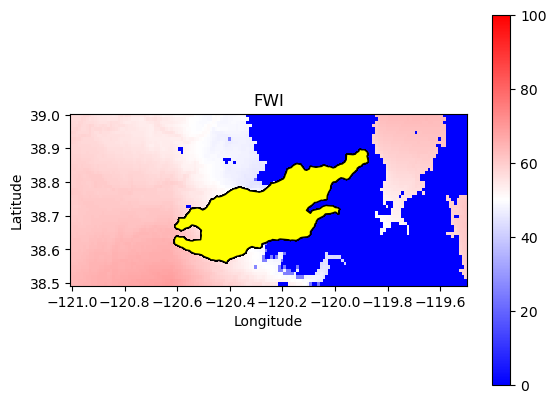

In [20]:
# veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_200207040000.d01.FWI.cog 
d0 = 0
len_days = len(dates)
for i in range(len_days - 1, len_days):
    print(i)
    root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + dates[i] +"0000.d01.FWI.cog")
    subset = root_moist.rio.clip_box(minx=min_lon, miny=min_lat, maxx=max_lon, maxy=max_lat)
    f, ax = plt.subplots()
    subset.plot(ax = ax, cmap = "bwr",  vmin = 0, vmax = 100, label = "FWI") # vmin = 0, vmax = 1,
    #ax.set_xlable("Longitude")
    #ax.xlable("Longitude")
    #sub_plot = ax.plot(subset, cmap = "bwr_r", vmin= 1, vmax = 1)
    if(i <= 6):

        gdf[d0:i].plot(ax=ax, facecolor="none", edgecolor='none')
    if(i > 6):
        index = i - 6
        gdf[d0:index].plot(ax=ax, facecolor="yellow", edgecolor='black') #facecolor="None"
    #ax.xlable("Longitude")
    ax.set_ylabel("Latitude", color = "black")
    ax.set_xlabel("Longitude", color = "black")
    ax.set_title("FWI", color = "black")
    #ax.spines["bottom"].set_color('white')
    #ax.spines["top"].set_color('white')
    #ax.spines["left"].set_color('white')
    #ax.spines["right"].set_color('white')
    #ax.xaxis.label.set_color('white')
    #ax.tick_params(colors='white')
    #plt.savefig(fname = (""+ m + "_vs_" + f+".pdf"))
    #params = {"text.color" : "white",
    #      "xtick.color" : "white",
    #      "ytick.color" : "white"}
    #plt.rcParams.update(params)
    if(i < 10):
        i_write = "0" + str(i)
    else:
        i_write = str(i)
    #plt.savefig('/projects/my-public-bucket/fire_weather_vis/base-fwi-vis/LIS_visualize/SW_fig/Caldor_Soil_moisture_raster_' + i_write + '.png', transparent=True, dpi = 450)
    plt.show()

In [21]:
# IMERGE Data Read in. 
#s3.ls("s3://veda-data-store-staging/EIS/zarr/GEOS5_FWI_GPM_LATE_v5_Daily.zarr/GPM.LATE.v5_FWI/0.0.0")
geos_fwi = xr.open_dataset("s3://veda-data-store-staging/EIS/zarr/GEOS5_FWI_GPM_LATE_v5_Daily.zarr", engine="zarr")
geos_fwi


<xarray.Dataset>
Dimensions:           (time: 3150, lat: 1330, lon: 3600)
Coordinates:
  * lat               (lat) float64 -57.95 -57.85 -57.75 ... 74.75 74.85 74.95
  * lon               (lon) float64 -179.9 -179.8 -179.8 ... 179.8 179.9 179.9
  * time              (time) datetime64[ns] 2014-05-01 2014-05-02 ... 2022-12-14
Data variables:
    GPM.LATE.v5_BUI   (time, lat, lon) float32 ...
    GPM.LATE.v5_DC    (time, lat, lon) float32 ...
    GPM.LATE.v5_DMC   (time, lat, lon) float32 ...
    GPM.LATE.v5_DSR   (time, lat, lon) float32 ...
    GPM.LATE.v5_FFMC  (time, lat, lon) float32 ...
    GPM.LATE.v5_FWI   (time, lat, lon) float32 ...
    GPM.LATE.v5_ISI   (time, lat, lon) float32 ...
Attributes: (12/46)
    Center:              NASA GISS / Columbia University
    Center::             center
    DCDryStartFactor:    5.0
    DCDryStartFactor::   DC number of days since precip mult factor for dry s...
    DCStart:             15.0
    DCStart::            DC starting value after wet winter
    ...                  ...
    snowCoverDaysCalc:   60.0
    snowCoverDaysCalc::  Number of days prior to spring over which to determi...
    startShutDays:       2.0
    startShutDays::      Number of previous days over which to consider start...
    tempThresh:          6.0
    tempThresh::         Temp thresh (C) to define start and end of winter

In [22]:

#geos_fwi.
#geos_short = geos_fwi.where((geos_fwi.time.astype("datetime64[ns]") > dt.datetime.strptime("2021-08-01", "%Y-%m-%d")) & (geos_fwi.time.astype("datetime64[ns]") < dt.strptime("2021-09-30", "%Y-%m-%d")))

In [23]:
#geos_fwi = geos_fwi.rio.set_spatial_dims(x_dim= "lat", y_dim = "lon") # 
#?geos_fwi.set_coords

In [24]:
g_fwi  = geos_fwi["GPM.LATE.v5_FWI"]
#g_fwi = g_fwi.rio.set_spatial_dims(x_dim= "lat", y_dim = "lon")
#print(min_lon)
#g_fwi.lon

#gsmall = g_fwi.sel(time ="2021-08", drop = True)

min_lat = 38.5
max_lat = 39.0
min_lon = -121.0 
max_lon = -119.50

gsmall = g_fwi.sel(lat = slice(min_lat, max_lat), lon = slice(min_lon, max_lon))
gffmc = geos_fwi["GPM.LATE.v5_FFMC"]
gisi = geos_fwi["GPM.LATE.v5_ISI"]
gdc = geos_fwi["GPM.LATE.v5_DC"]
gdmc = geos_fwi["GPM.LATE.v5_DMC"]

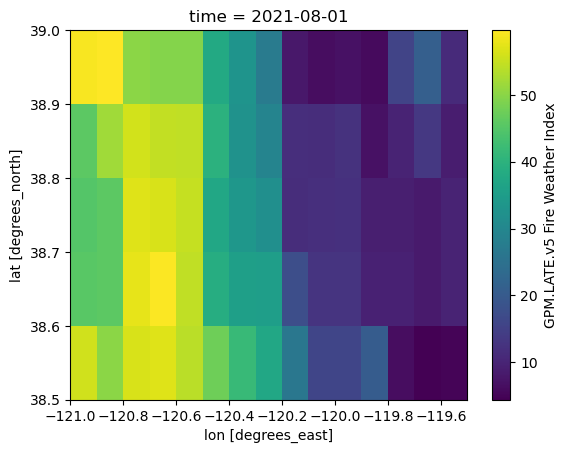

In [25]:
gsmall.sel(time = "2021-08-01").plot()

Station lat 38.717
Sstation lon -120.75


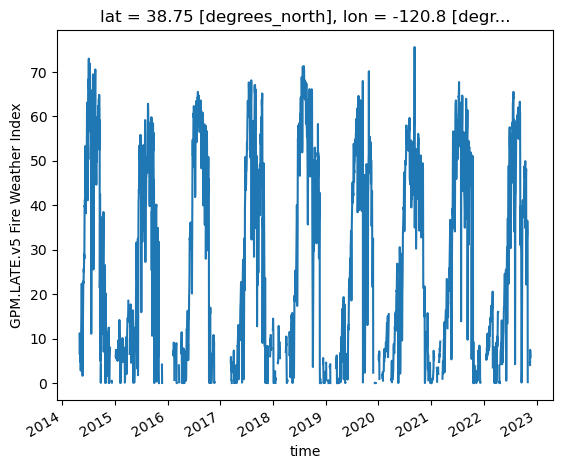

In [26]:
#foi = [{"Lat":38.586 ,    ### Fire center lat and lon
#        "Lon":-120.537833 
#    
#}]
print("Station lat", st_cls["Lat"])
print("Sstation lon", st_cls["Lon"])

gsmall.sel(lat = 38.717, lon = -120.75, method='nearest').plot()

In [27]:
## Both rasters at once



date_df = pd.DataFrame()
date_df["dates_fl"] = dates

#date_df["dates_fl"] = dates_long
date_df["dates_clean"] = date_df["dates_fl"].astype("datetime64[ns]")


date_df

,dates_fl,dates_clean
0,20210801,2021-08-01
1,20210802,2021-08-02
2,20210803,2021-08-03
3,20210804,2021-08-04
4,20210805,2021-08-05
...,...,...
56,20210926,2021-09-26
57,20210927,2021-09-27
58,20210928,2021-09-28
59,20210929,2021-09-29


1


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


2


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


3


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


4


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


5


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


6


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


7


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


8


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


9


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


10


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


11


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


12


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


13


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


14


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


15


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


16


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


17


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


18


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


19


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


20


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


21


/tmp/ipykernel_7980/3164753209.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  f, (ax3, ax) = plt.subplots(1, 2, figsize=(20,8))
/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


22


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


23


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


24


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


25


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


26


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


27


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


28


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


29


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


30


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


31


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


32


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


33


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


34


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


35


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


36


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


37


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


38


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


39


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


40


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


41


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


42


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


43


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


44


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


45


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


46


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


47


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


48


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


49


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


50


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


51


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


52


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


53


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


54


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


55


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


56


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


57


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


58


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


59


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


60


/tmp/ipykernel_7980/3164753209.py:9: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")


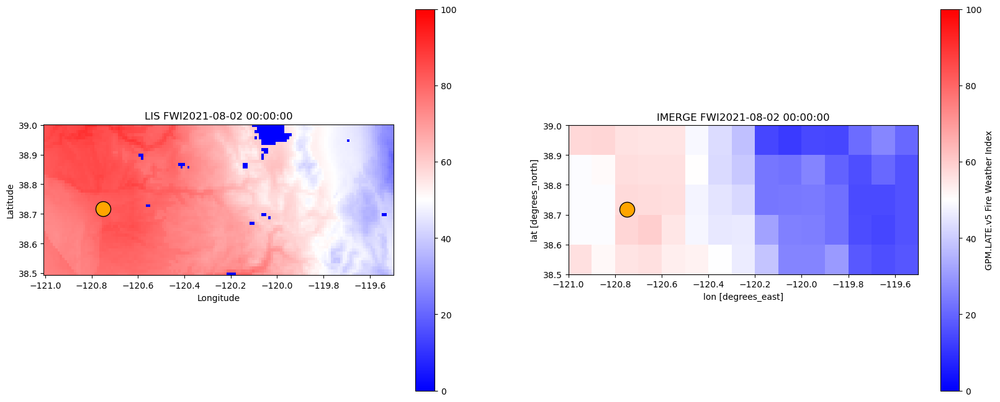

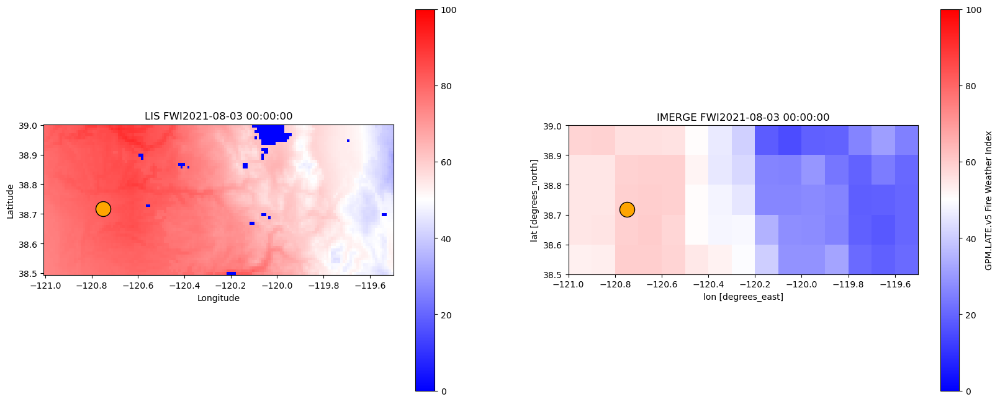

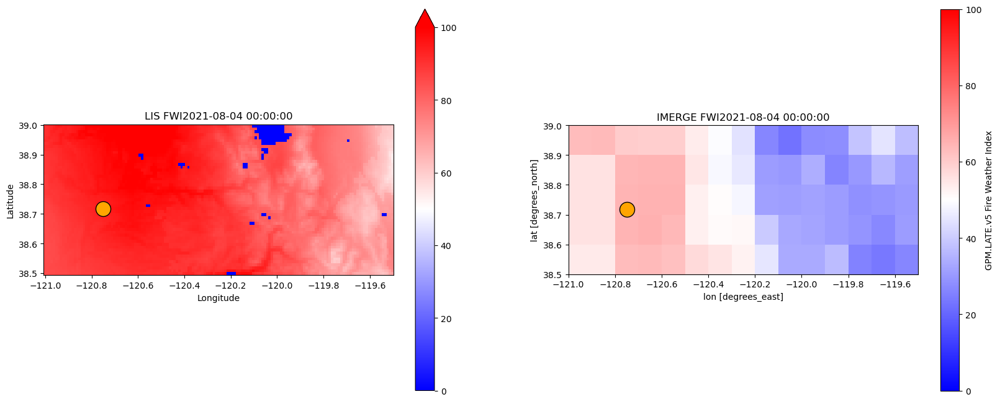

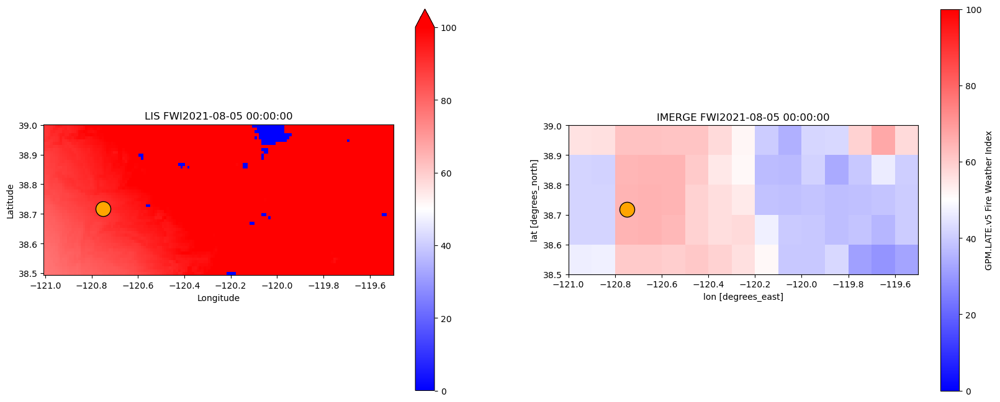

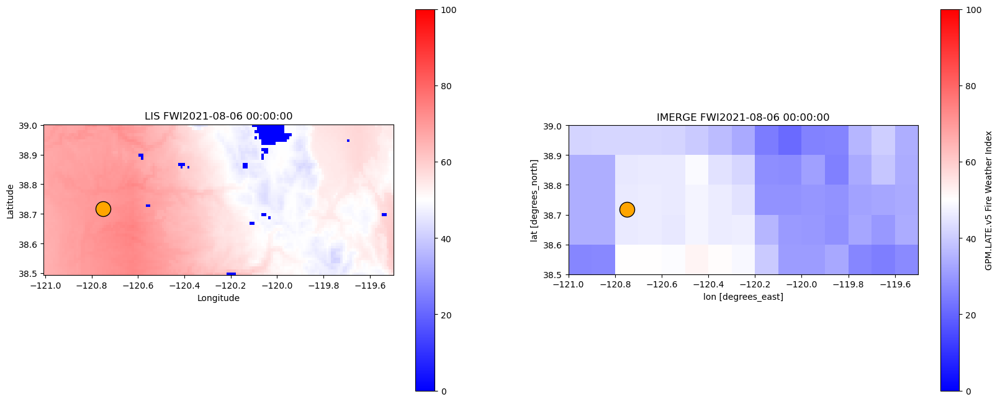

...

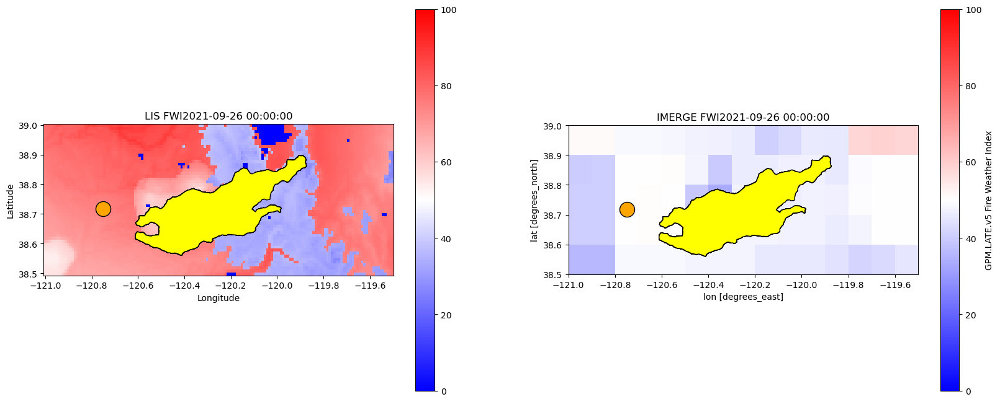

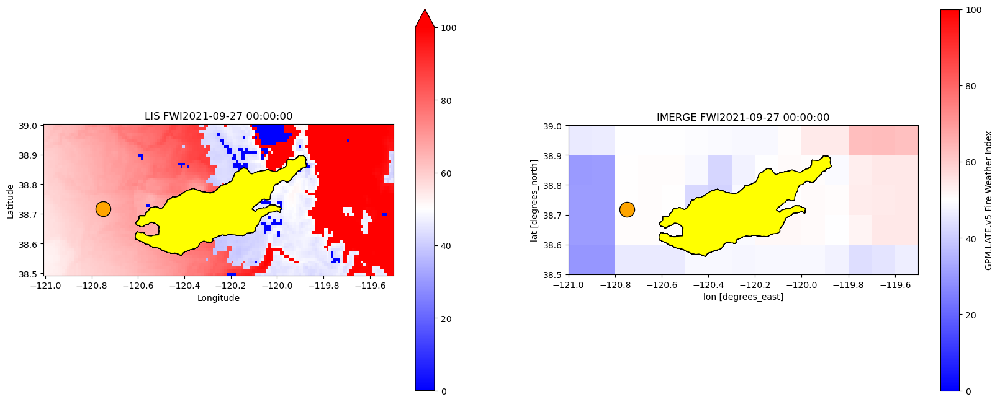

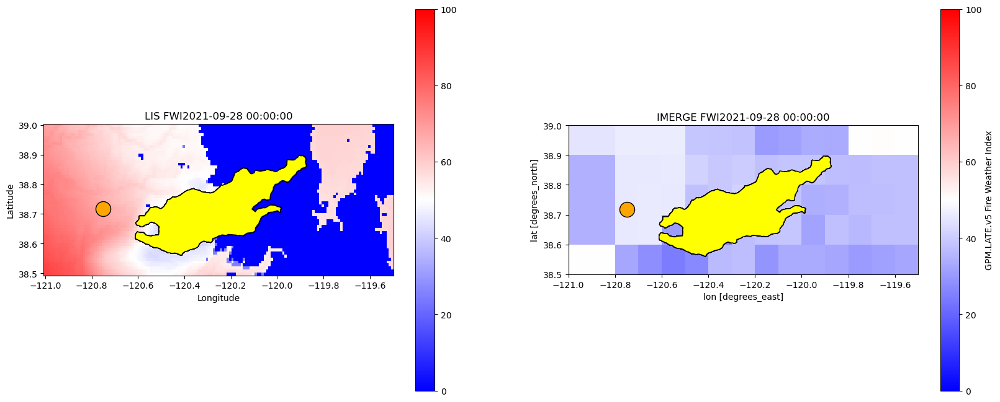

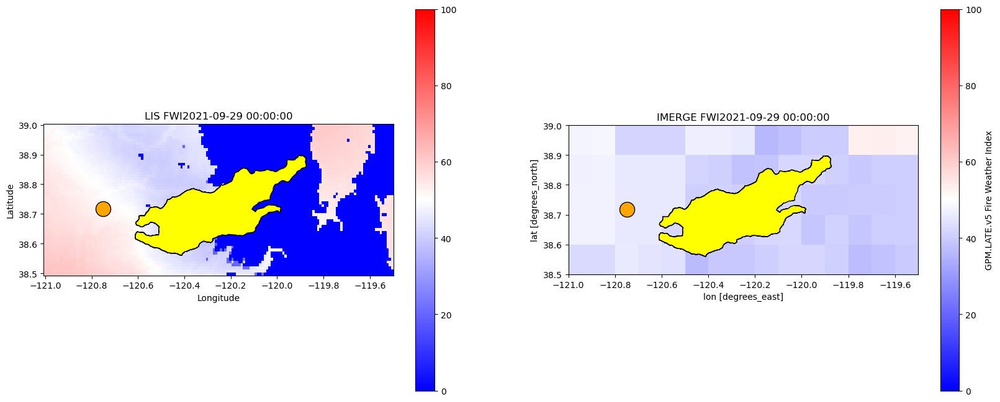

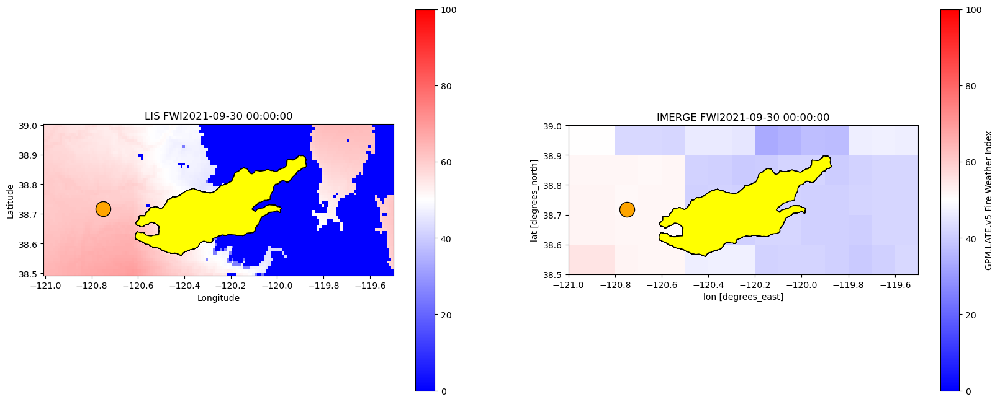

In [28]:
len_days = len(date_df.dates_fl)

for i in range(1, len_days):
    print(i)
    ## Static Plot with Doug's feedback
    f, (ax3, ax) = plt.subplots(1, 2, figsize=(20,8))
    
        ## Adding the raster
    root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")
    subset = root_moist.rio.clip_box(minx=min_lon, miny=min_lat, maxx=max_lon, maxy=max_lat)
    subset.plot(ax = ax3, cmap = "bwr", vmin = 0, vmax = 100, label = "LIS FWI")
    #ax.set_xlable("Longitude")
    #ax.xlable("Longitude")
    #sub_plot = ax.plot(subset, cmap = "bwr_r", vmin= 1, vmax = 1)
    #if(i <= 6):

    gdf[d0:i].plot(ax=ax3, facecolor="none", edgecolor='none')
    
    if(i > 6):
        index = i - 6
        gdf[d0:index].plot(ax=ax3, facecolor="yellow", edgecolor='black') #facecolor="None"
    #ax.xlable("Longitude")
    ax3.set_ylabel("Latitude", color = "black")
    ax3.set_xlabel("Longitude", color = "black")
    ax3.set_title(("LIS FWI" + str(date_df.dates_clean[i]) ), color = "black")
    ax3.scatter(y = 38.717, x = -120.75, color = "orange", s = 300, edgecolors= "black")

    if(i < 10):
        i_write = "0" + str(i)
    else:
        i_write = str(i)

    gsmall.sel(time = date_df.dates_clean[i]).plot(ax = ax, cmap = "bwr", vmin = 0, vmax = 100)
    gdf[d0:i].plot(ax=ax, facecolor="none", edgecolor='none')
    ax.set_title(("IMERGE FWI" + str(date_df.dates_clean[i])))
    ax.scatter(y = 38.717, x = -120.75, color = "orange", s = 300, edgecolors= "black")
    
    params = {"text.color" : "black",
          "xtick.color" : "black",
          "ytick.color" : "black"}
    plt.rcParams.update(params)
    
    if(i > 6):
        index = i - 6
        gdf[d0:index].plot(ax=ax, facecolor="yellow", edgecolor='black') #facecolor="None"


    ## The save statement
    #plt.savefig('/projects/my-public-bucket/fire_weather_vis/base-fwi-vis/LIS_visualize/fwi_fig_multi/FWI_mulit_'+ i_write +'.png', dpi = 200)
    #plt.show()

In [29]:
st = st.rename(columns={"time":"t"})
full_fr = pd.merge(gdf,st, on = "t", how = "outer")
full_fr = full_fr.sort_values(by = ['t'])
type(full_fr)

geopandas.geodataframe.GeoDataFrame

In [30]:
root_moist

<xarray.DataArray (band: 1, y: 2110, x: 1560)>
[3291600 values with dtype=float32]
Coordinates:
  * band     (band) int64 1
  * y        (y) float64 52.99 52.98 52.97 52.96 ... 31.94 31.93 31.92 31.91
  * x        (x) float64 -125.0 -125.0 -125.0 -125.0 ... -109.4 -109.4 -109.4
Attributes:
    transform:           (0.009994664762122057, 0.0, -124.99500274658203, 0.0...
    crs:                 +init=epsg:4326
    res:                 (0.009994664762122057, 0.009994664762122057)
    is_tiled:            1
    nodatavals:          (0.0,)
    scales:              (1.0,)
    offsets:             (0.0,)
    AREA_OR_POINT:       Area
    OVR_RESAMPLING_ALG:  NEAREST

In [31]:
## Need to read in all the LIS date for time series
d0 = 0
len_days = len(date_df.dates_fl)
fwi_LIS = np.repeat(np.nan, len_days)
for i in range(0, len_days):
    tmp_fwi = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog").sel(y = 38.717, x = -120.75, method='nearest')
    mean_fwi = float(tmp_fwi.mean())
    fwi_LIS[i] = mean_fwi


/tmp/ipykernel_7980/3021626423.py:6: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  tmp_fwi = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog").sel(y = 38.717, x = -120.75, method='nearest')
/tmp/ipykernel_7980/3021626423.py:6: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  tmp_fwi = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog").sel(y = 38.717, x = -120.75, method='nearest')
/tmp/ipykernel_7980/3021626423.py:6: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about tran

In [32]:
fwi_LIS
date_df["fwi_list"] = fwi_LIS

gsmaller = gsmall.sel(lat = 38.717, lon = -120.75,  method='nearest') ## based on station lat and lon


Text(0, 0.5, 'Fire Weather Index')

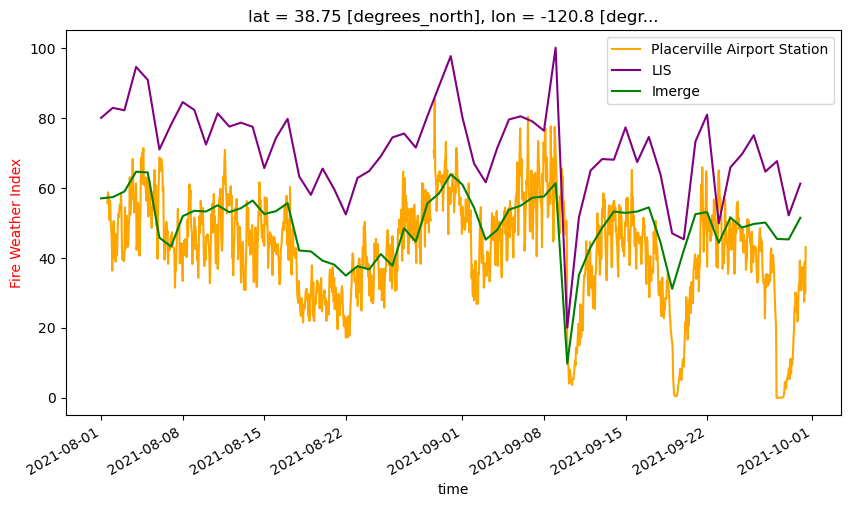

In [33]:
## All timeseries on one plot
f, (ax) = plt.subplots(1, figsize=(10,5))

ax.plot(full_fr.t, full_fr.FWI, color = "orange", label = "Placerville Airport Station" )  # c = full_fr.FWI, cmap = "bwr", vmin = 0, vmax = 100
ax.plot(date_df.dates_clean, date_df.fwi_list, color = "purple", label = "LIS")
gsmaller.sel(time = slice("2021-08-01", "2021-09-30")).plot(color = "green", label = "Imerge")
ax.legend()



ax.set_ylabel("Fire Weather Index",color="red")

In [34]:
ffmc_files = s3.ls("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FFMC")
print(ffmc_files[0])
s3.ls("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/")



veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FFMC/LIS_FWI_COMP_20UTC_200201010000.d01.FFMC.cog


['veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/BUI',
 'veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/DC',
 'veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/DMC',
 'veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FFMC',
 'veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI',
 'veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/ISI']

In [35]:
## Looking at component parts of FWI, FFMC

d0 = 0
len_days = len(date_df.dates_fl)
ffmc_LIS = np.repeat(np.nan, len_days)
for i in range(0, len_days):
    tmp_ffmc = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FFMC/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FFMC.cog").sel(y = 38.717, x = -120.75, method='nearest')
    mean_ffmc = float(tmp_ffmc.mean())
    ffmc_LIS[i] = mean_ffmc
    
date_df["ffmc_lis"] = ffmc_LIS

/tmp/ipykernel_7980/1656076559.py:7: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  tmp_ffmc = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FFMC/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FFMC.cog").sel(y = 38.717, x = -120.75, method='nearest')
/tmp/ipykernel_7980/1656076559.py:7: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  tmp_ffmc = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FFMC/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FFMC.cog").sel(y = 38.717, x = -120.75, method='nearest')
/tmp/ipykernel_7980/1656076559.py:7: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information abou

In [36]:
gffmc_small = gffmc.sel(lat = 38.717, lon = -120.75, method='nearest') # lat = 38.717, lon = -120.75

Text(0, 0.5, 'FFMC')

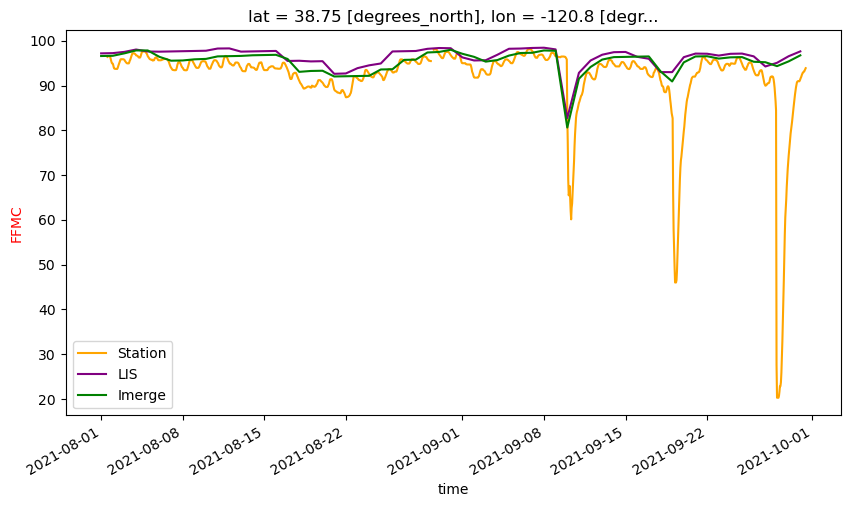

In [37]:
f, (ax) = plt.subplots(1, figsize=(10,5))

ax.plot(full_fr.t, full_fr.FFMC, color = "orange", label = "Station" )  # c = full_fr.FWI, cmap = "bwr", vmin = 0, vmax = 100
ax.plot(date_df.dates_clean, date_df.ffmc_lis, color = "purple", label = "LIS")
gffmc_small.sel(time = slice("2021-08-01", "2021-09-30")).plot(color = "green", label = "Imerge")
ax.legend()



ax.set_ylabel("FFMC",color="red")

In [38]:
## ISI

d0 = 0
len_days = len(date_df.dates_fl)
isi_LIS = np.repeat(np.nan, len_days)
for i in range(0, len_days):
    tmp_isi = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/ISI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.ISI.cog").sel(y = 38.717, x = -120.75, method='nearest')
    #print(float(tmp_isi.mean()))
    mean_isi = float(tmp_isi.mean())
    isi_LIS[i] = mean_isi
    
date_df["isi_lis"] = isi_LIS

/tmp/ipykernel_7980/3285992844.py:7: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  tmp_isi = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/ISI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.ISI.cog").sel(y = 38.717, x = -120.75, method='nearest')
/tmp/ipykernel_7980/3285992844.py:7: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  tmp_isi = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/ISI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.ISI.cog").sel(y = 38.717, x = -120.75, method='nearest')
/tmp/ipykernel_7980/3285992844.py:7: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about tran

Text(0, 0.5, 'ISI')

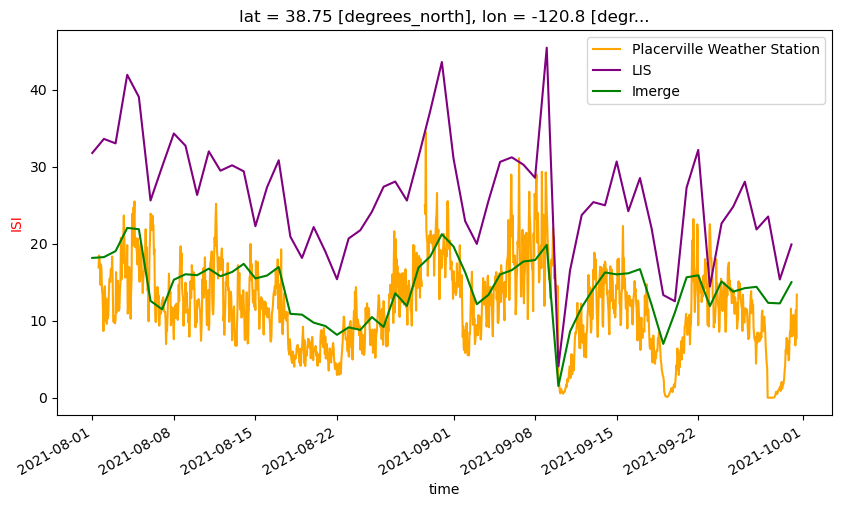

In [39]:

gisi_small = gisi.sel(lat = 38.717, lon = -120.75, method='nearest')


f, (ax) = plt.subplots(1, figsize=(10,5))

ax.plot(full_fr.t, full_fr.ISI, color = "orange", label = "Placerville Weather Station" )  # c = full_fr.FWI, cmap = "bwr", vmin = 0, vmax = 100
ax.plot(date_df.dates_clean, date_df.isi_lis, color = "purple", label = "LIS")
gisi_small.sel(time = slice("2021-08-01", "2021-09-30")).plot(color = "green", label = "Imerge")
ax.legend()
ax.set_ylabel("ISI",color="red")

In [40]:
## DMC

d0 = 0
len_days = len(date_df.dates_fl)
dmc_LIS = np.repeat(np.nan, len_days)
for i in range(0, len_days):
    tmp_dmc = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/DMC/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.DMC.cog").sel(y = 38.717, x = -120.75, method='nearest')
    #print(float(tmp_isi.mean()))
    mean_dmc = float(tmp_dmc.mean())
    dmc_LIS[i] = mean_dmc
    
date_df["dmc_lis"] = dmc_LIS

/tmp/ipykernel_7980/1461541077.py:7: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  tmp_dmc = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/DMC/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.DMC.cog").sel(y = 38.717, x = -120.75, method='nearest')
/tmp/ipykernel_7980/1461541077.py:7: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  tmp_dmc = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/DMC/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.DMC.cog").sel(y = 38.717, x = -120.75, method='nearest')
/tmp/ipykernel_7980/1461541077.py:7: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about tran

Text(0, 0.5, 'DMC')

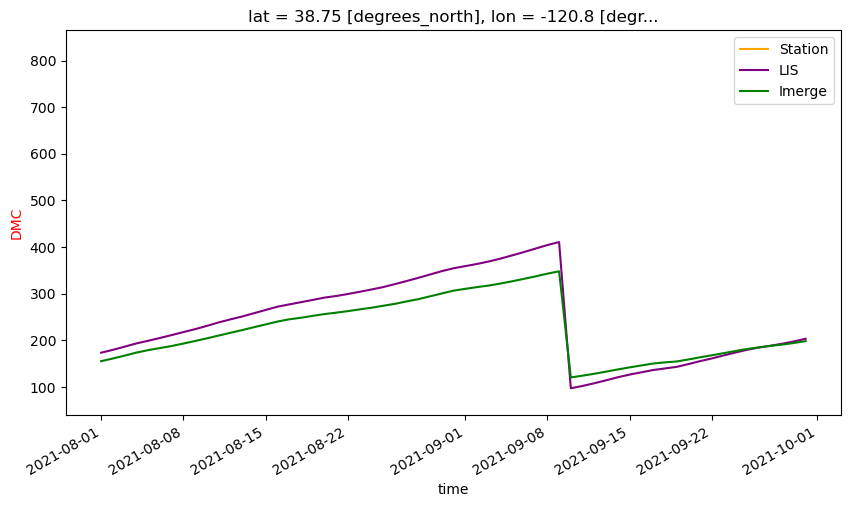

In [41]:
gdmc_small = gdmc.sel(lat = 38.717, lon = -120.75, method='nearest')


f, (ax) = plt.subplots(1, figsize=(10,5))

ax.plot(full_fr.t, full_fr.DMC, color = "orange", label = "Station" )  # c = full_fr.FWI, cmap = "bwr", vmin = 0, vmax = 100
ax.plot(date_df.dates_clean, date_df.dmc_lis, color = "purple", label = "LIS")
gdmc_small.sel(time = slice("2021-08-01", "2021-09-30")).plot(color = "green", label = "Imerge")
ax.legend()
ax.set_ylabel("DMC",color="red")

In [42]:
d0 = 0
len_days = len(date_df.dates_fl)
dc_LIS = np.repeat(np.nan, len_days)
for i in range(0, len_days):
    tmp_dc = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/DC/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.DC.cog").sel(y = 38.717, x = -120.75, method='nearest')
    #print(float(tmp_isi.mean()))
    mean_dc = float(tmp_dc.mean())
    dc_LIS[i] = mean_dc
    
date_df["dc_lis"] = dc_LIS

/tmp/ipykernel_7980/3013133336.py:5: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  tmp_dc = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/DC/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.DC.cog").sel(y = 38.717, x = -120.75, method='nearest')
/tmp/ipykernel_7980/3013133336.py:5: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transitioning, see: https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
  tmp_dc = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/DC/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.DC.cog").sel(y = 38.717, x = -120.75, method='nearest')
/tmp/ipykernel_7980/3013133336.py:5: DeprecationWarning: open_rasterio is Deprecated in favor of rioxarray. For information about transition

Text(0, 0.5, 'DC')

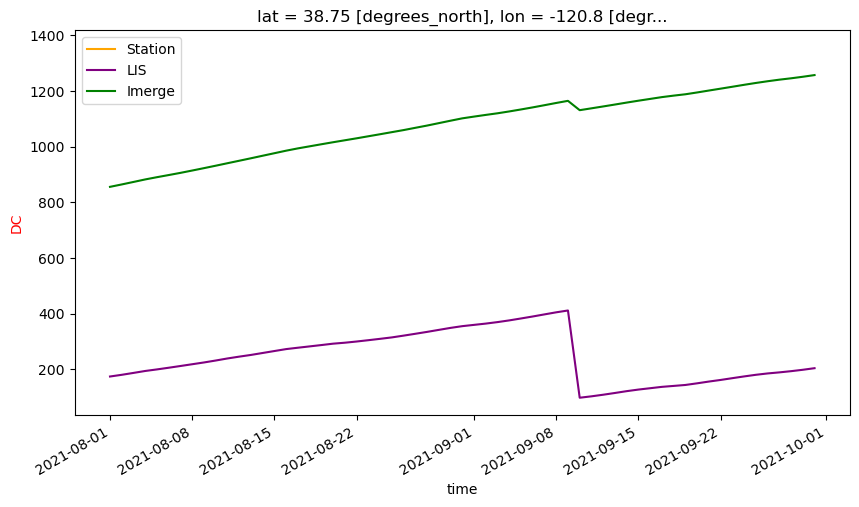

In [43]:
gdc_small = gdc.sel(lat = 38.717, lon = -120.75, method='nearest')


f, (ax) = plt.subplots(1, figsize=(10,5))

ax.plot(full_fr.t, full_fr.DC, color = "orange", label = "Station" )  # c = full_fr.FWI, cmap = "bwr", vmin = 0, vmax = 100
ax.plot(date_df.dates_clean, date_df.dmc_lis, color = "purple", label = "LIS")
gdc_small.sel(time = slice("2021-08-01", "2021-09-30")).plot(color = "green", label = "Imerge")
ax.legend()
ax.set_ylabel("DC",color="red")

In [44]:
# Making the HQ update figure with just IMERGE

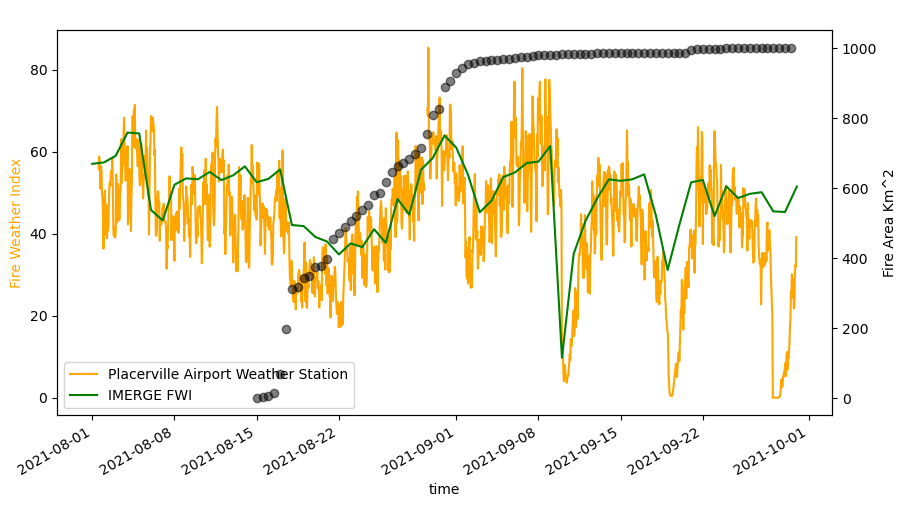

In [45]:
full_fr = full_fr[full_fr.t < "2021-09-30"]

## All timeseries on one plot
f, (ax) = plt.subplots(1, figsize=(10,5))

ax.plot(full_fr.t, full_fr.FWI, color = "orange", label = "Placerville Airport Weather Station" )  # c = full_fr.FWI, cmap = "bwr", vmin = 0, vmax = 100
#ax.plot(date_df.dates_clean, date_df.fwi_list, color = "purple", label = "LIS")
gsmaller.sel(time = slice("2021-08-01", "2021-09-30")).plot(color = "green", label = "IMERGE FWI")
ax.set_title(" ")
ax2 = ax.twinx()
ax2.scatter(full_fr.t, full_fr.farea, color = "black", label = "Fire Area", alpha = 0.5)
ax2.set_ylabel("Fire Area Km^2")
ax.set_ylabel("Fire Weather Index",color="orange")
ax.legend(loc = 'lower left')
plt.savefig('/projects/my-public-bucket/fire_weather_vis/base-fwi-vis/LIS_visualize/FWI_Caldor_Imerge.png', dpi = 450)


In [46]:
#plt.rcParams.keys()

st_point = Point(38.717, -120.75)
#?Point

1


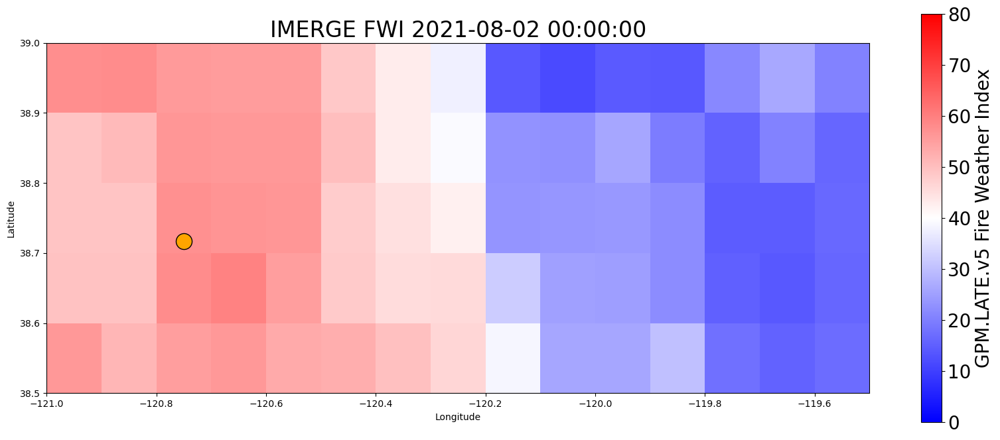

2


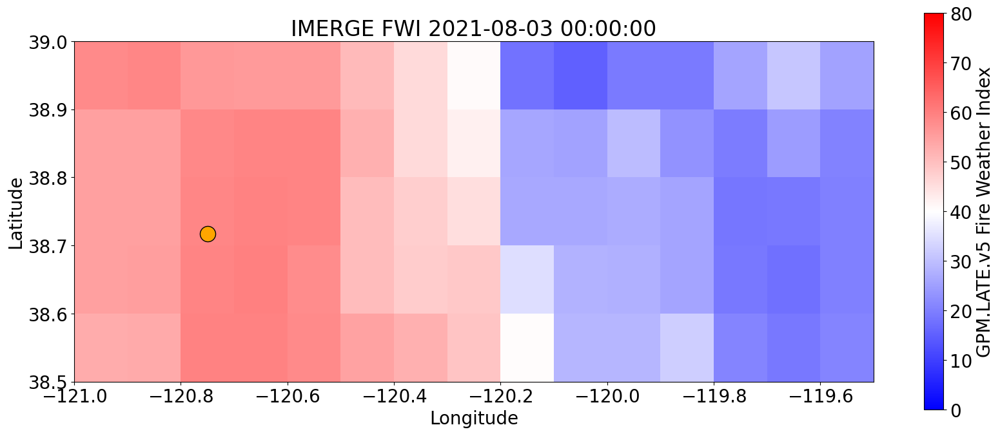

3


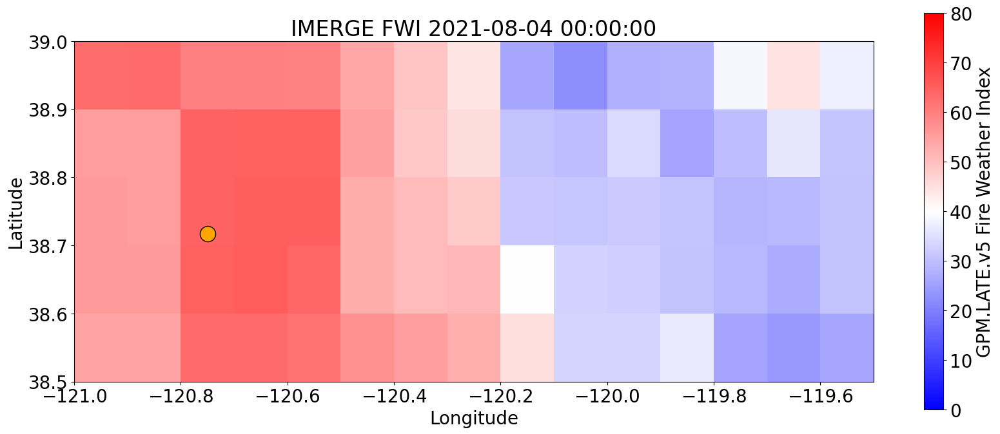

4


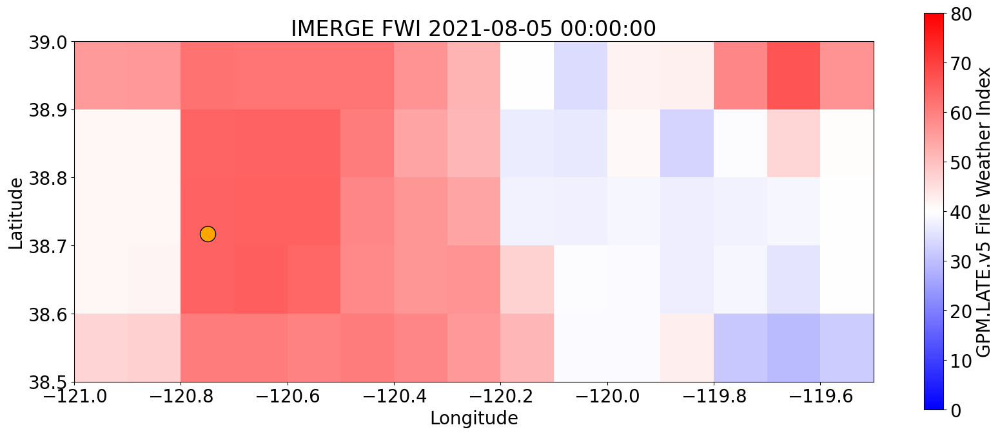

5


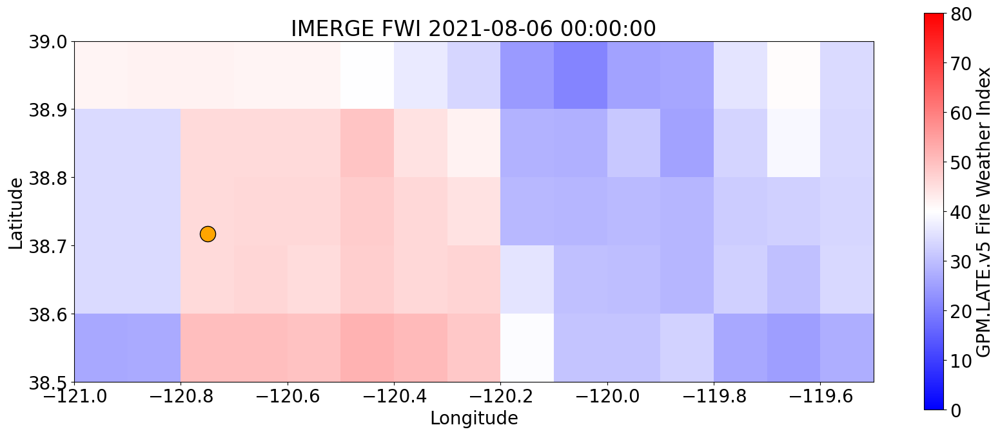

6


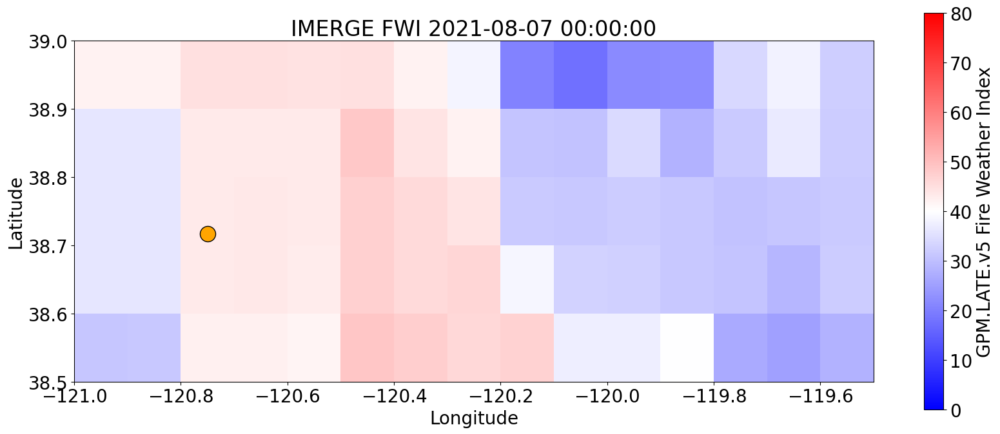

7


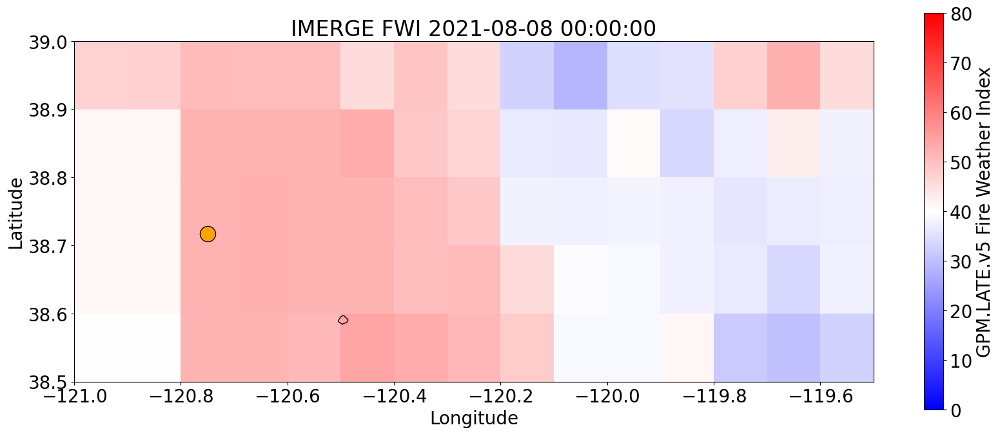

8


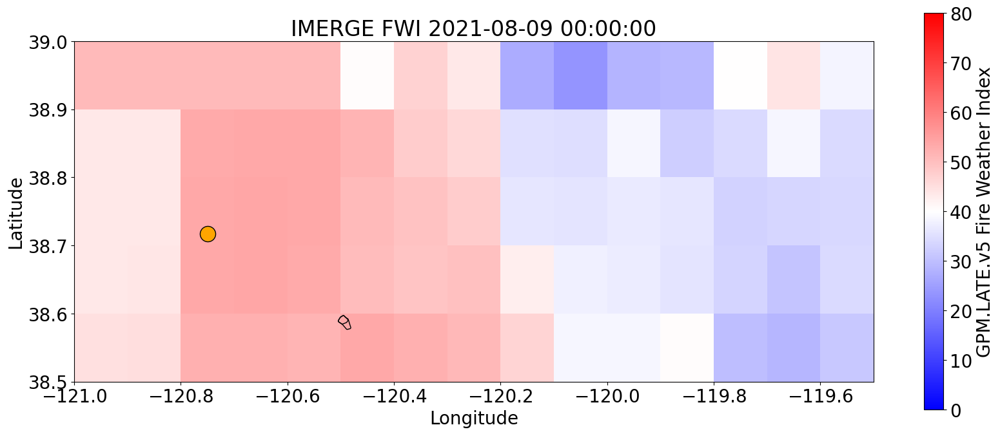

9


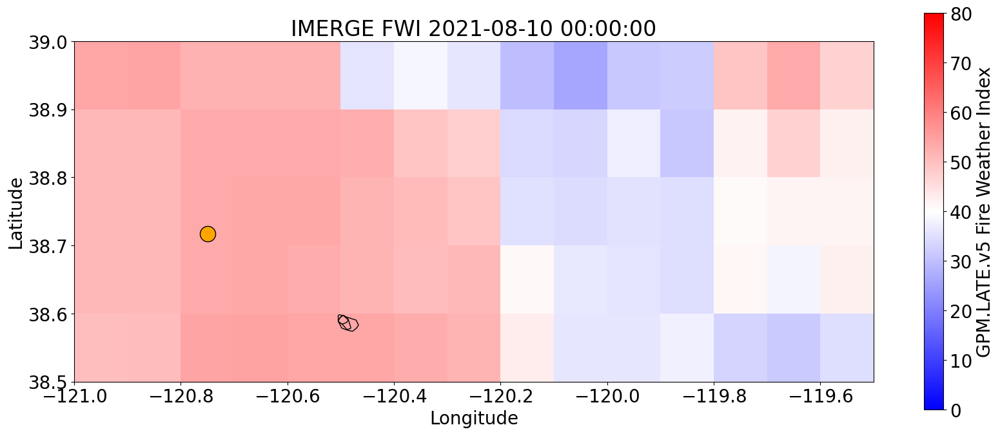

10


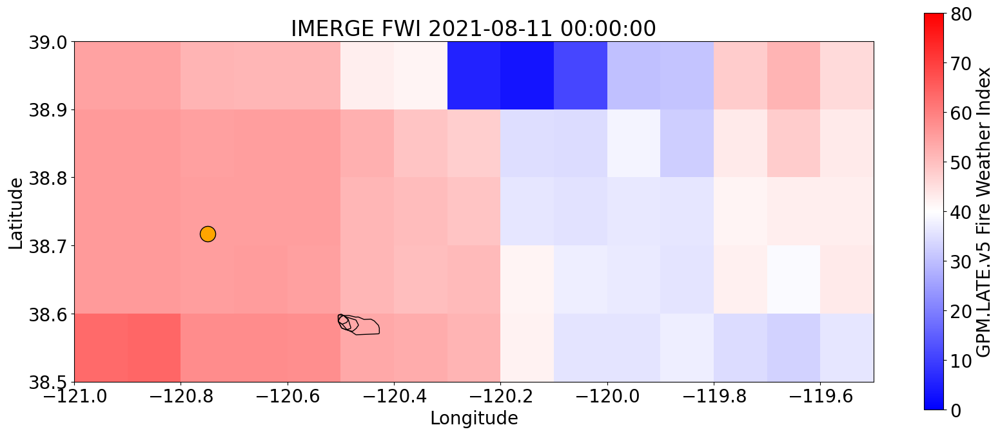

11


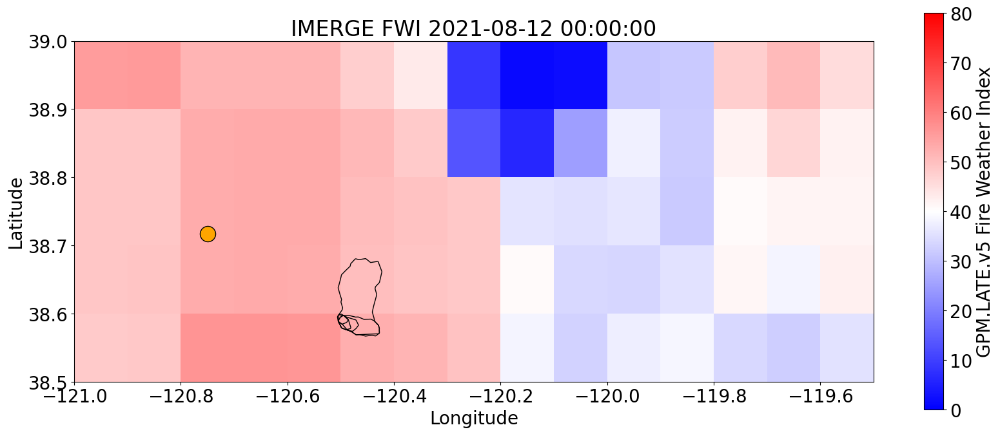

12


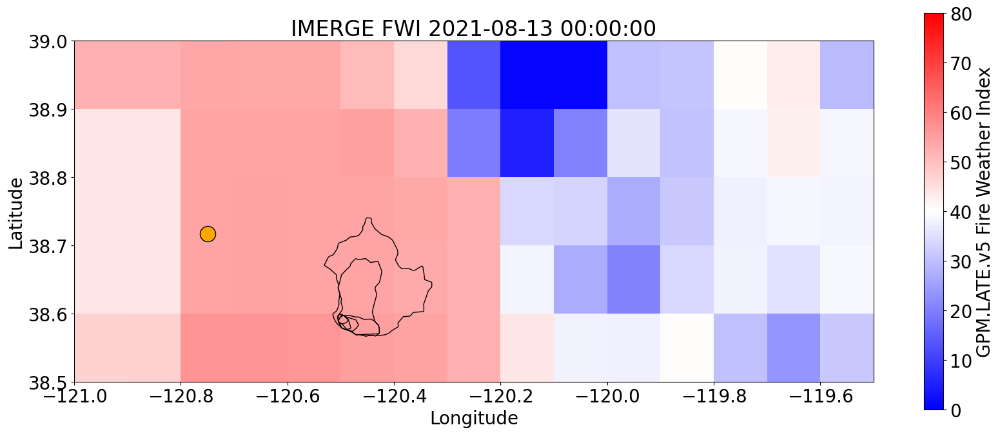

13


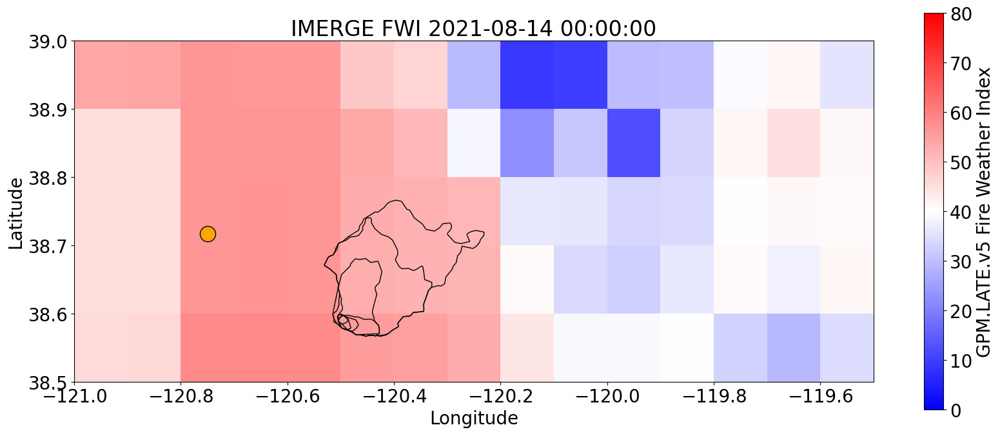

14


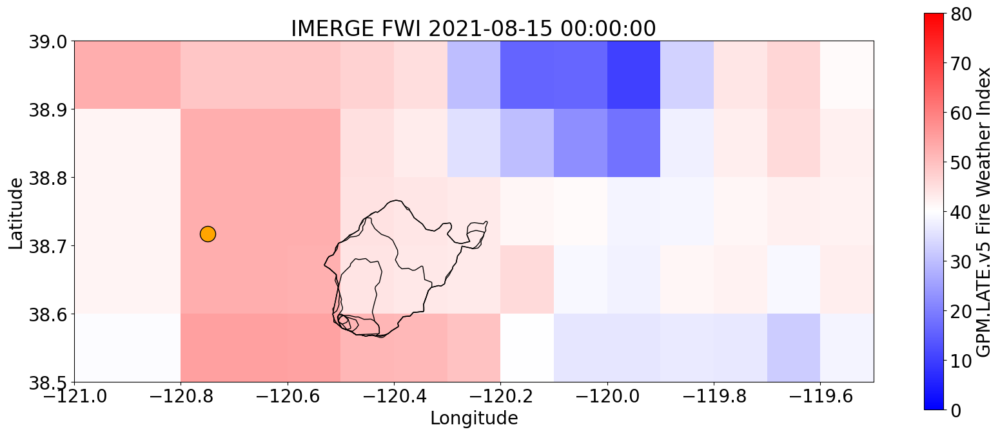

15


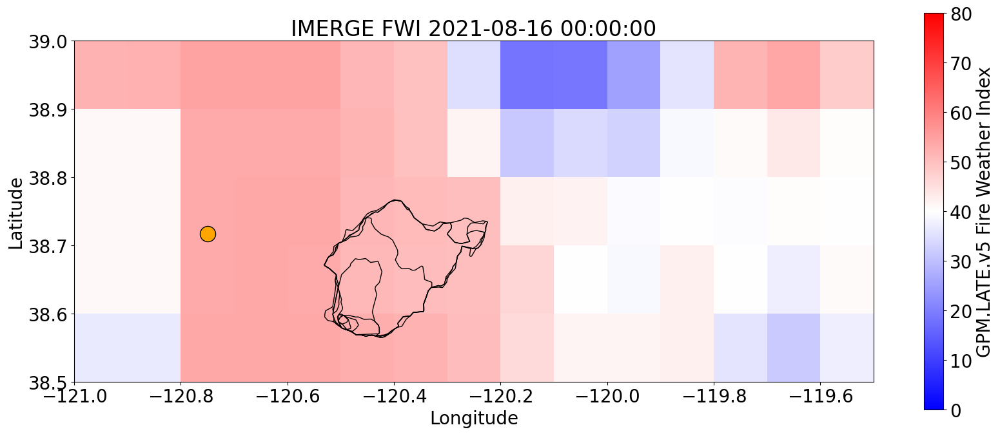

16


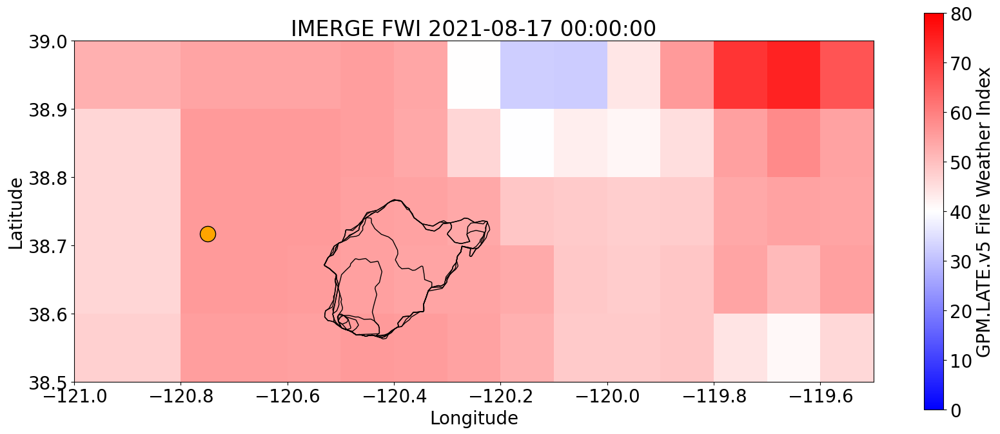

17


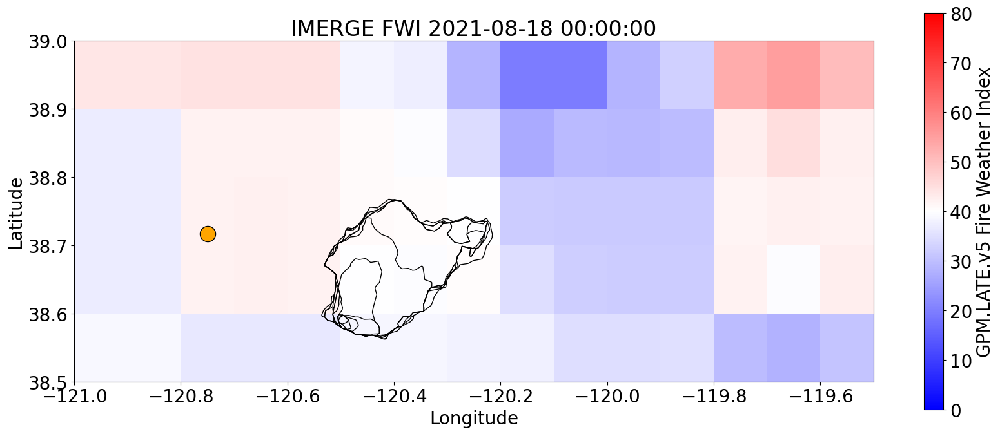

18


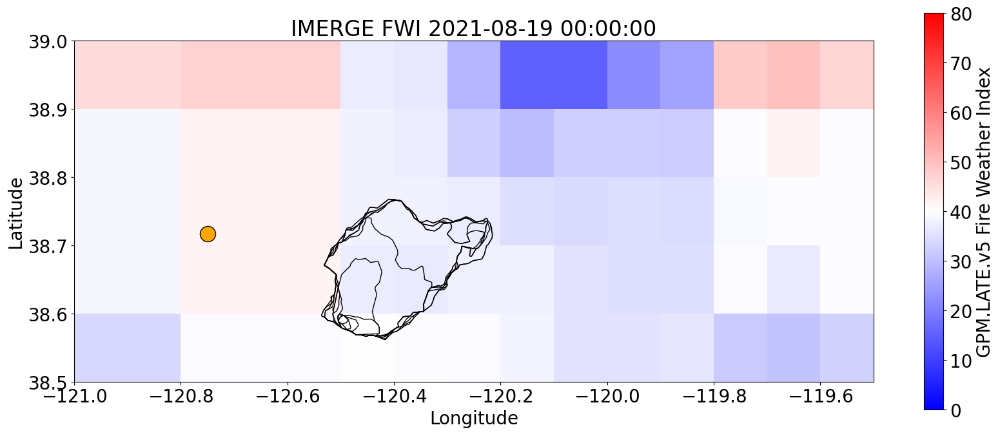

19


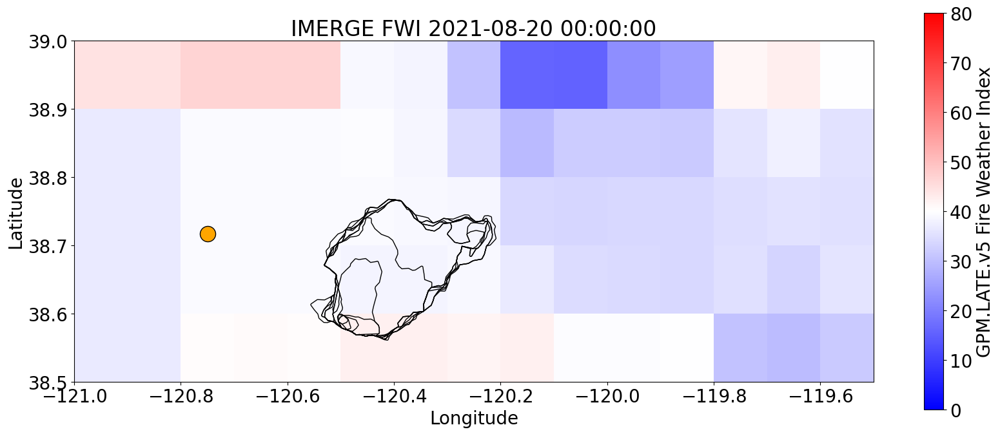

20


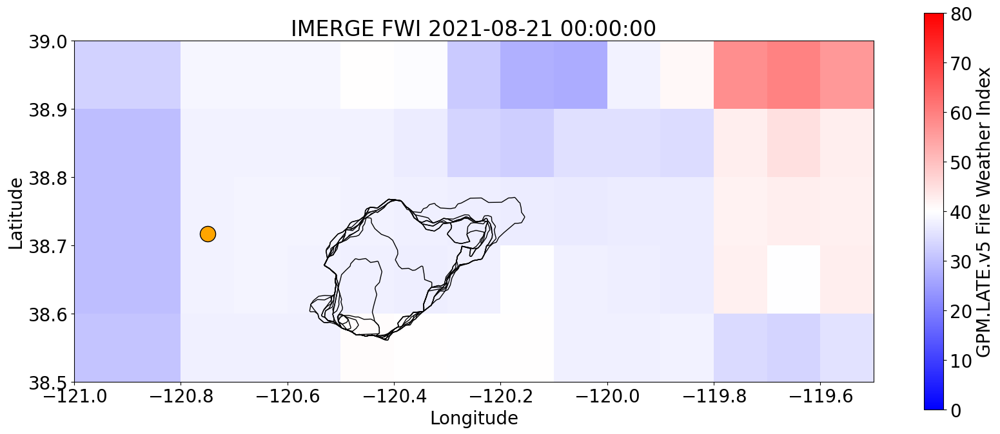

21


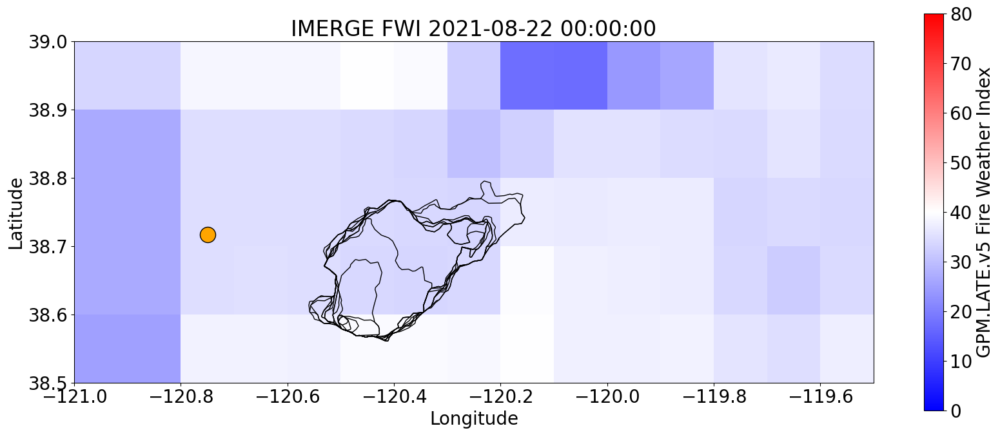

22


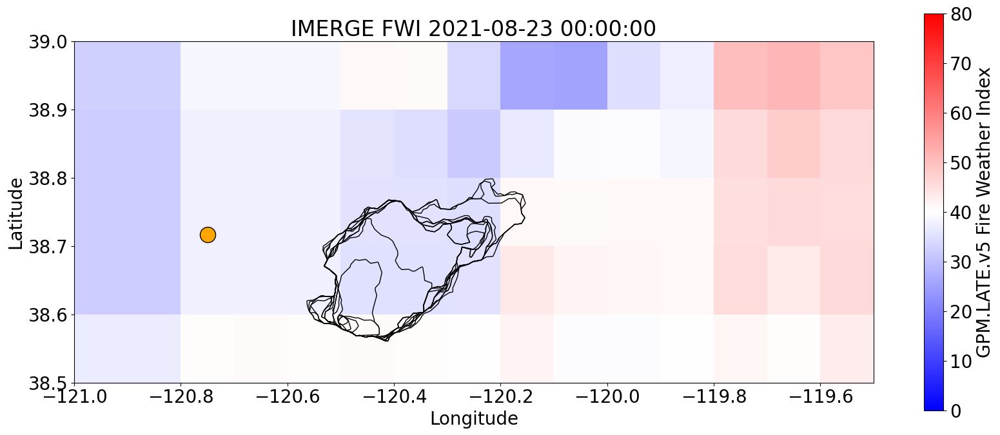

23


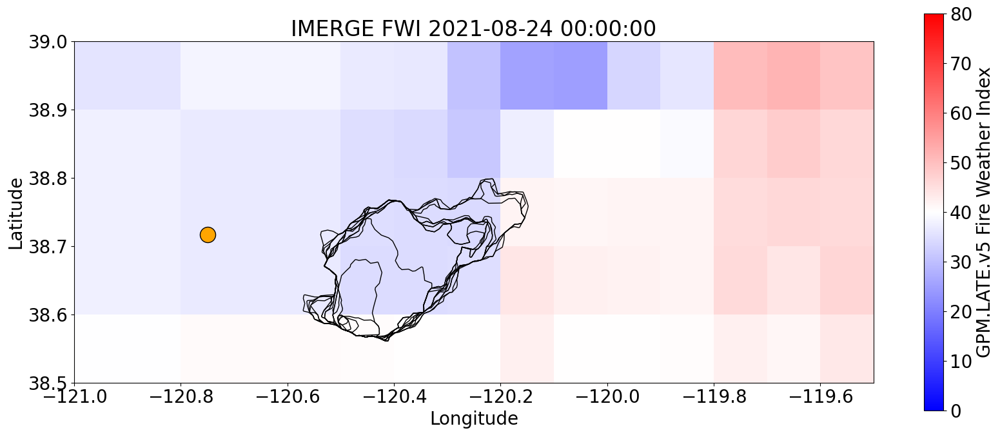

24


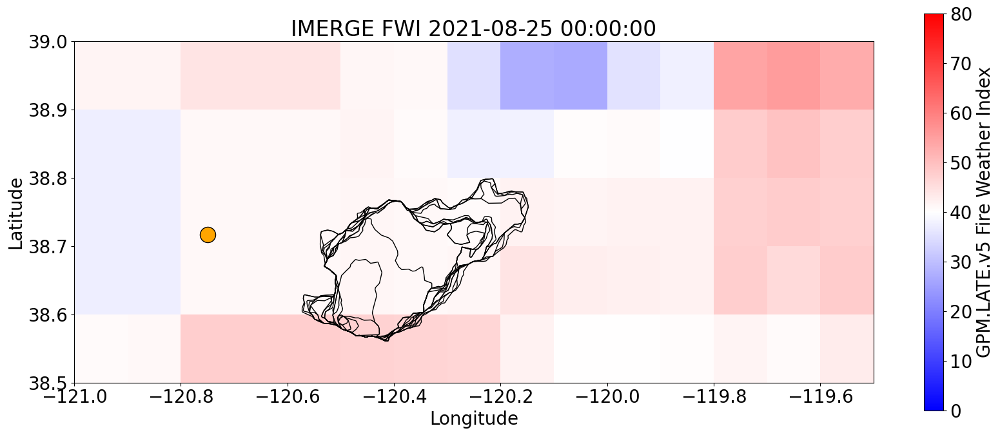

25


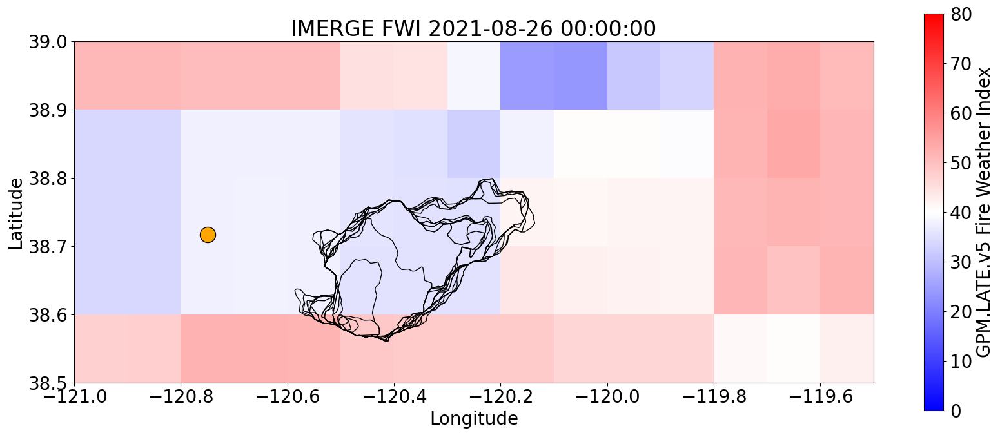

26


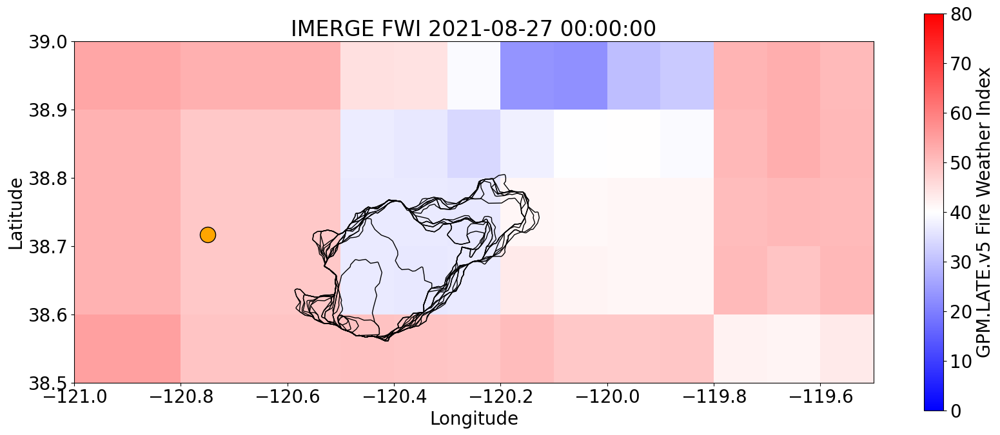

27


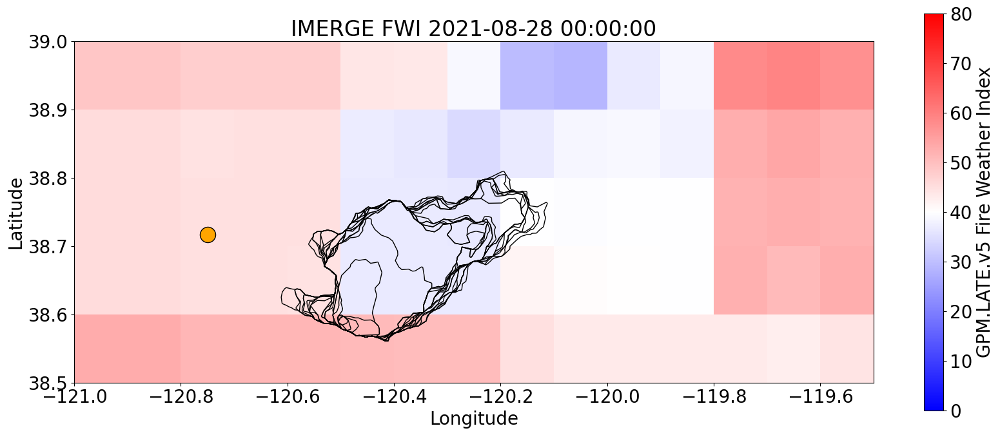

28


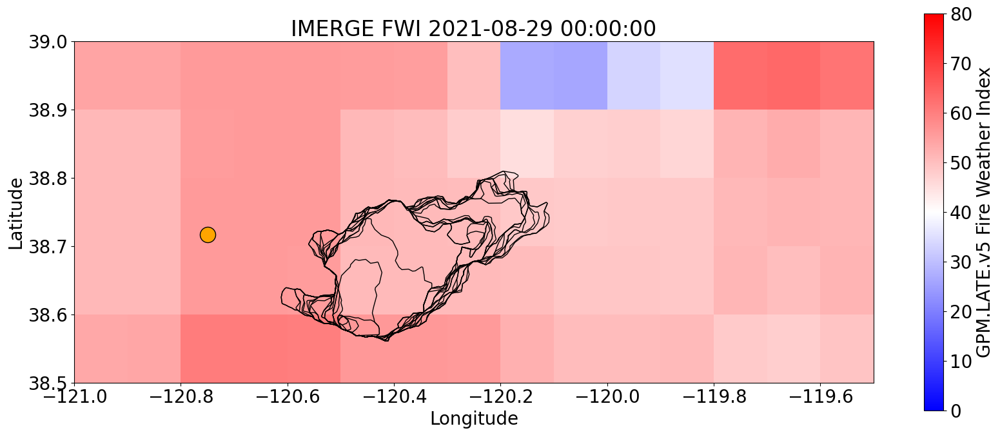

29


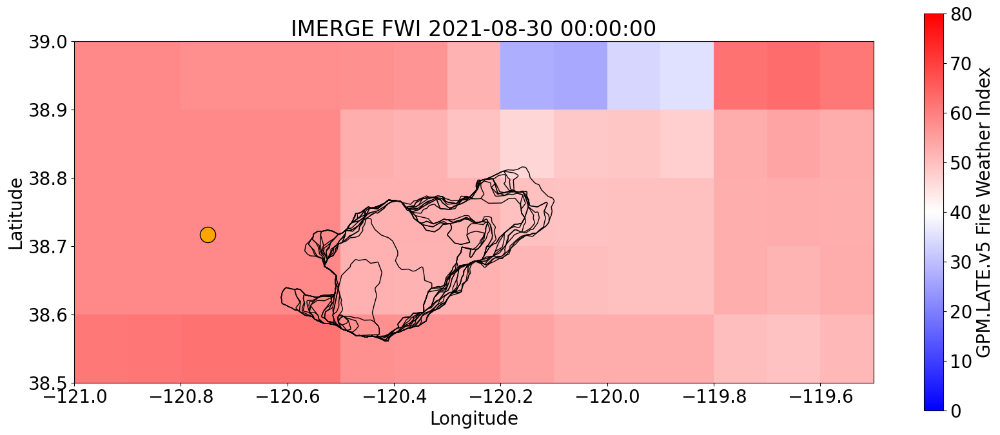

30


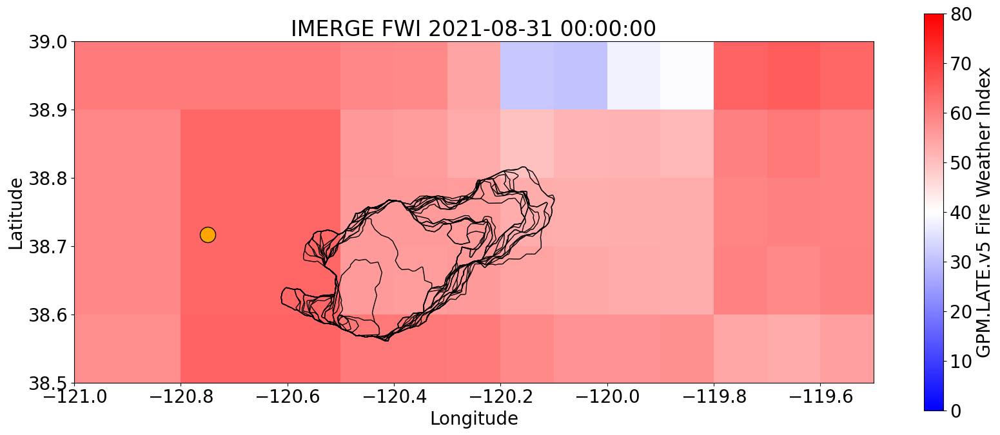

31


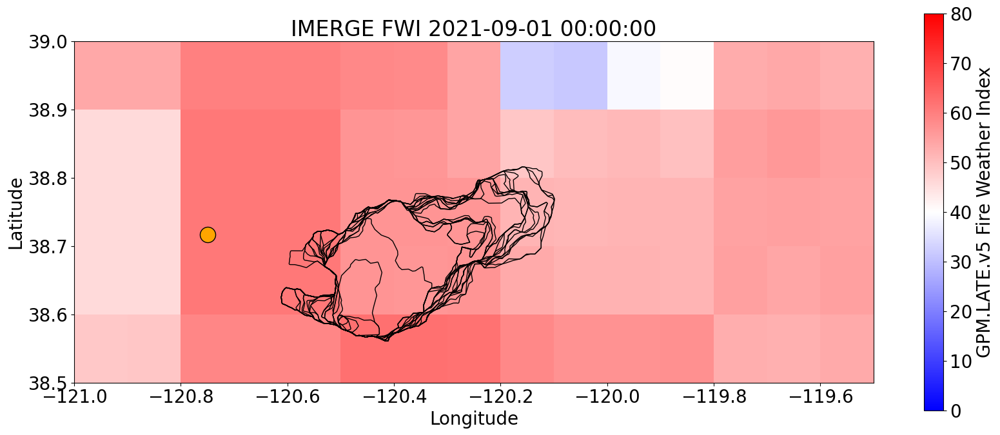

32


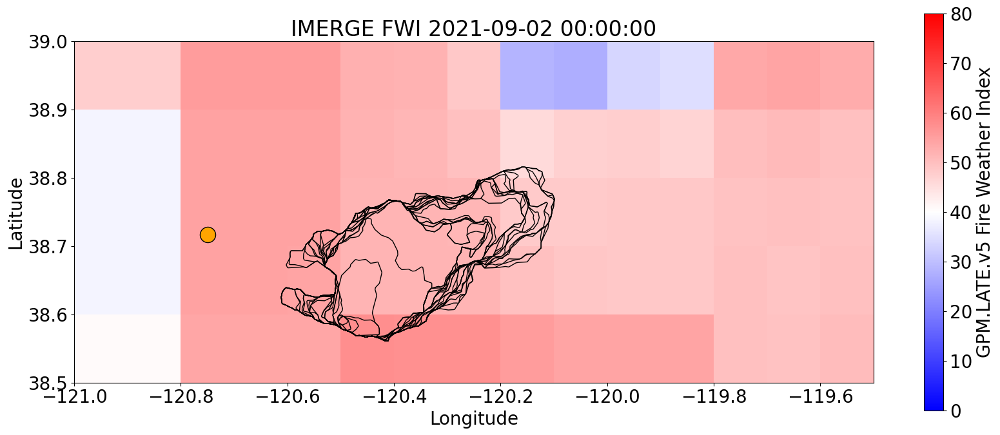

33


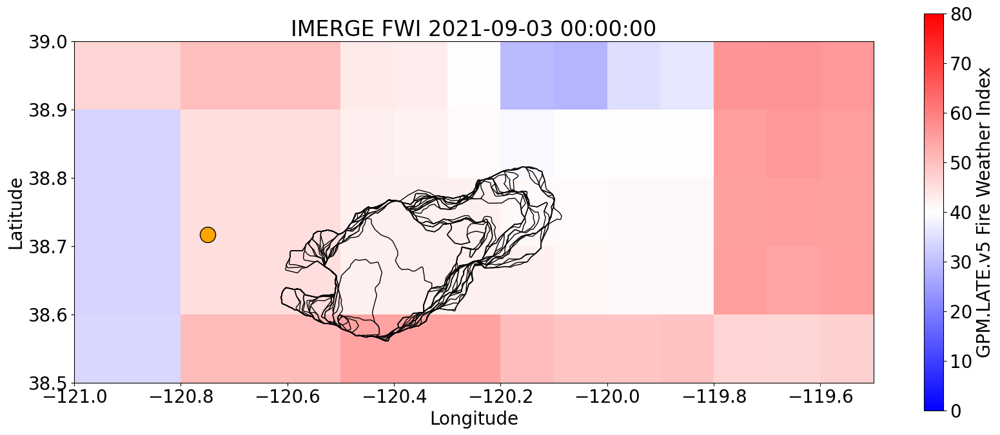

34


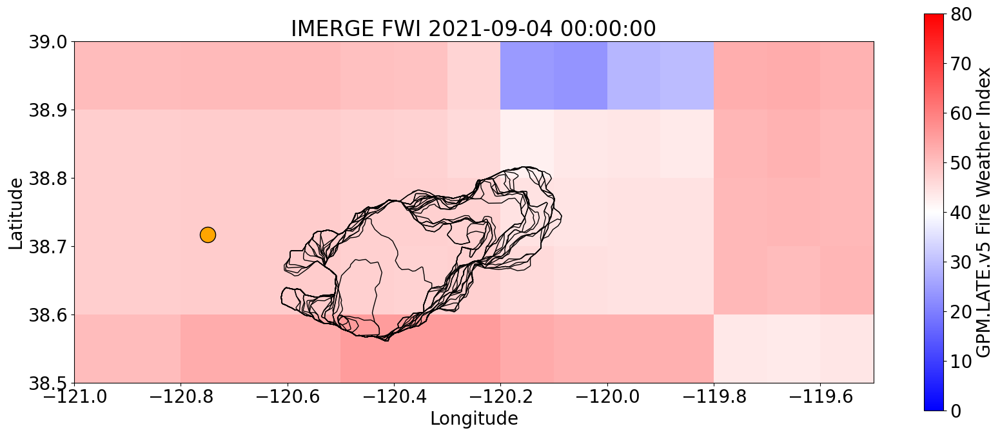

35


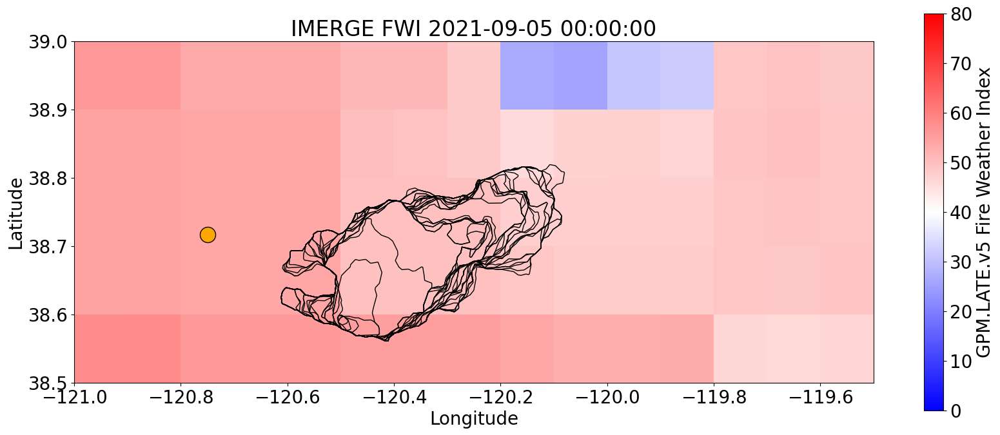

36


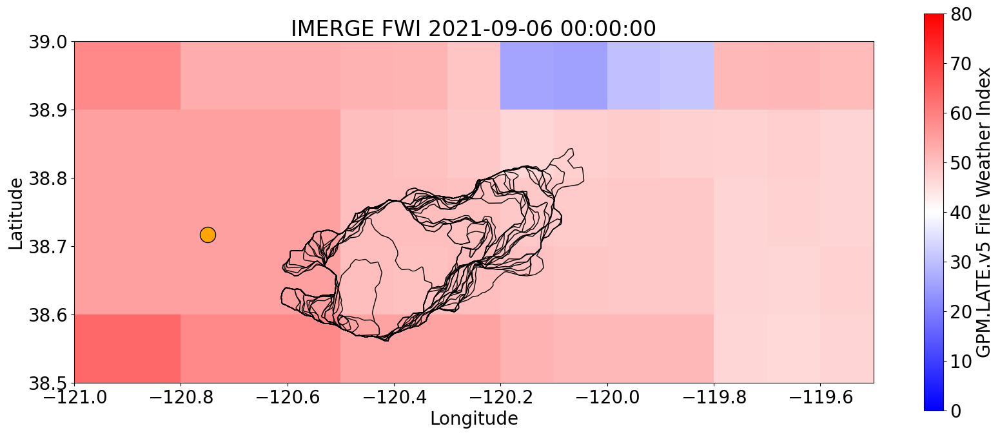

37


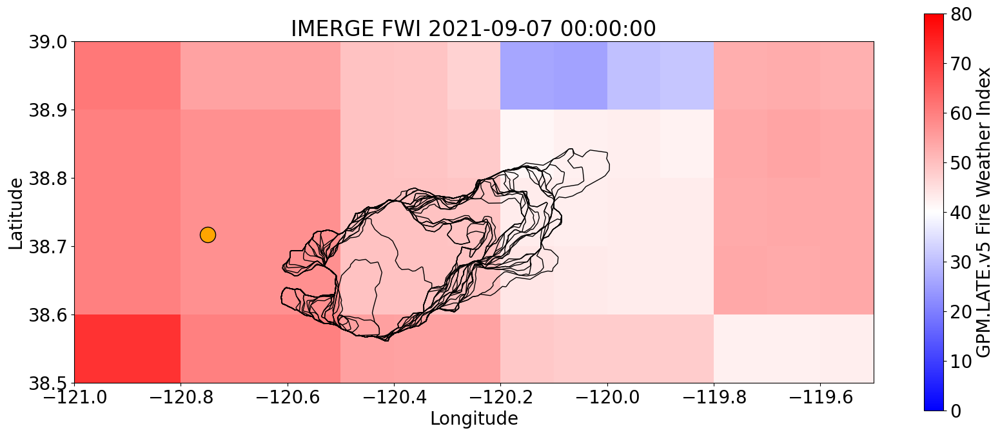

38


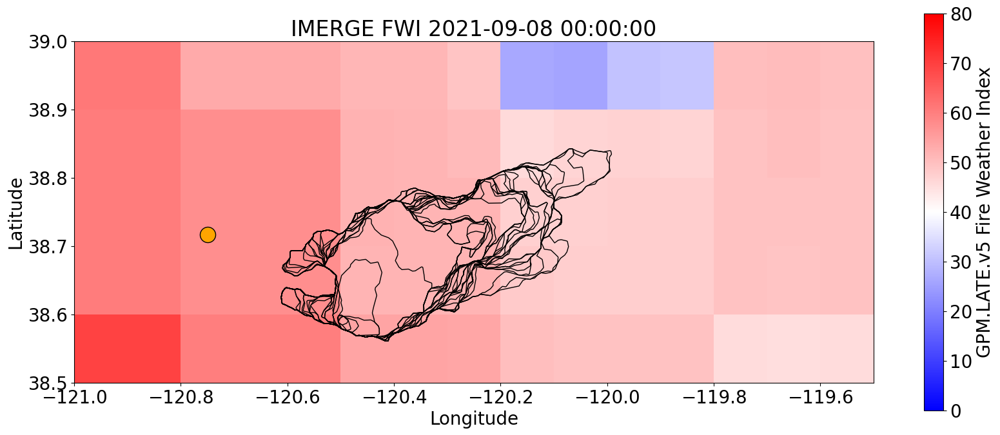

39


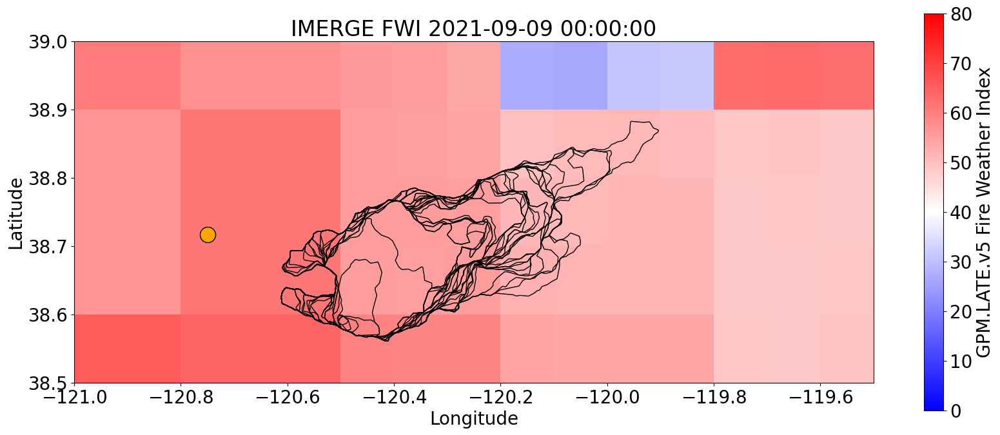

40


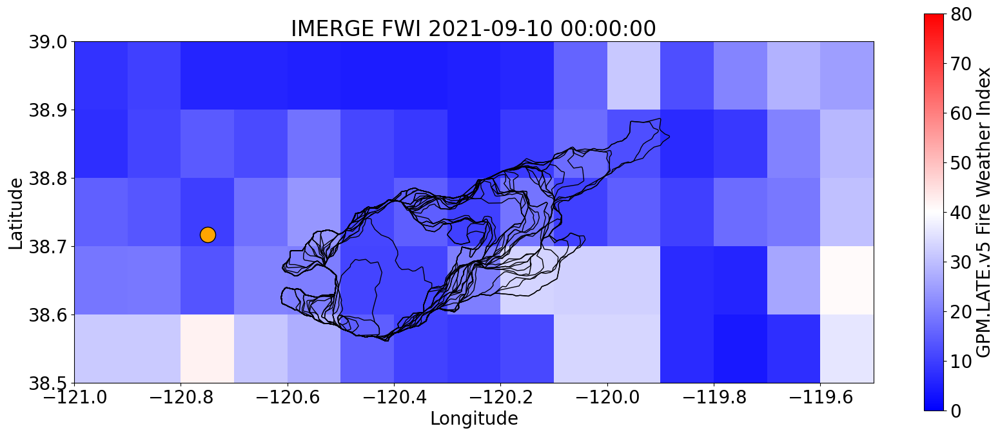

41


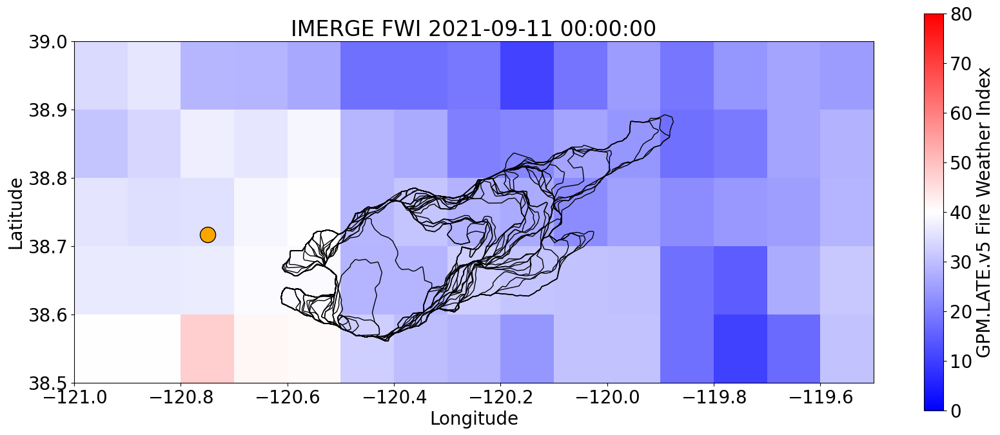

42


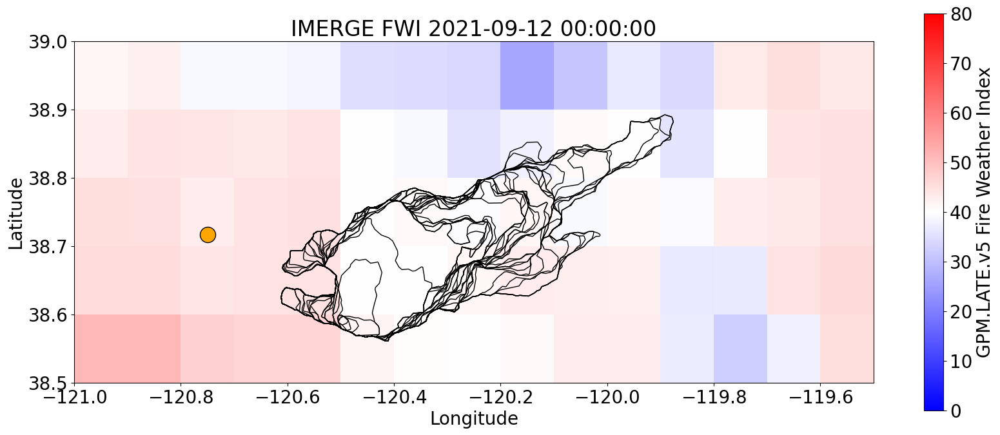

43


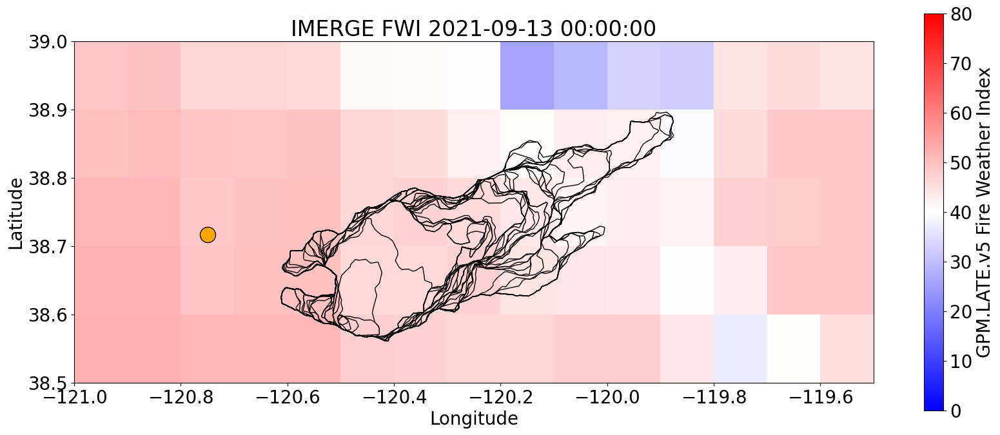

44


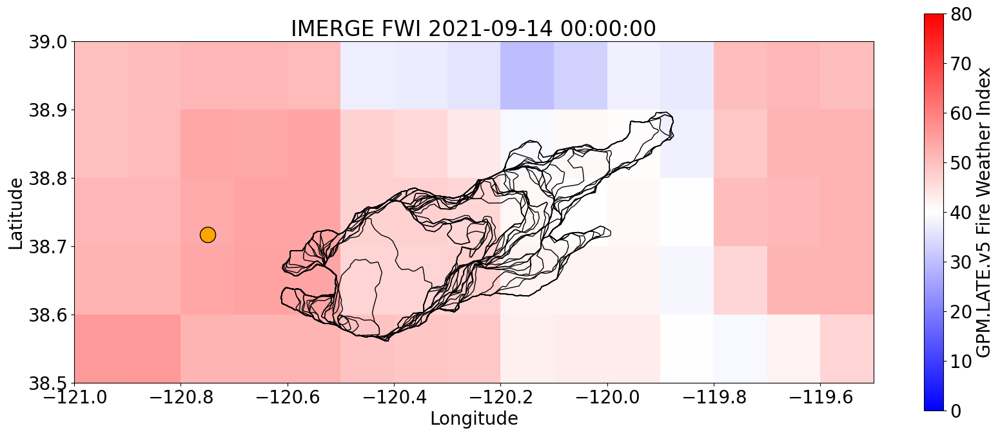

45


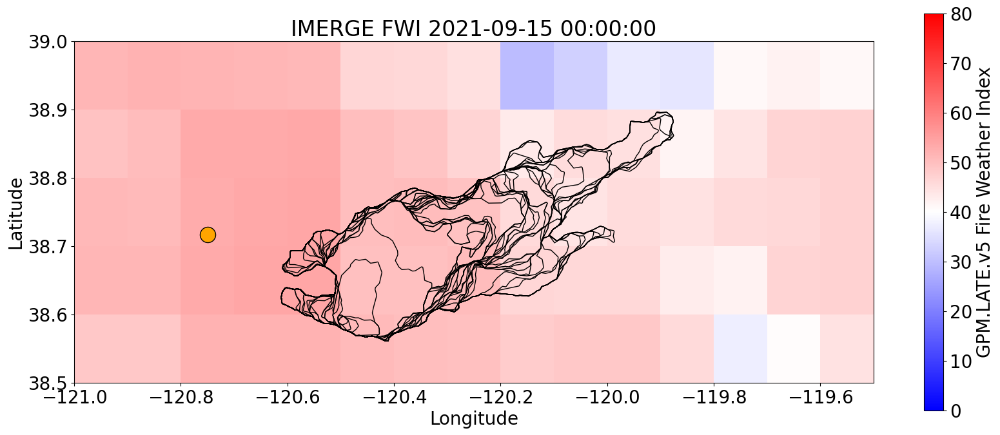

46


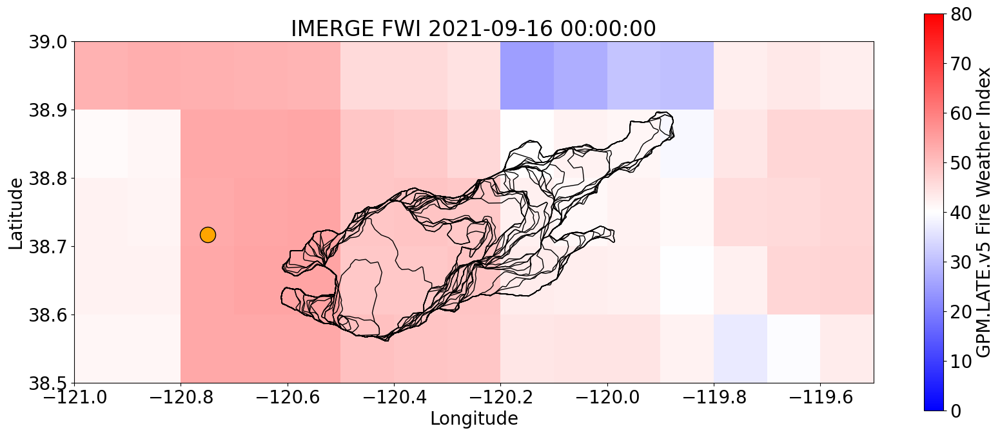

47


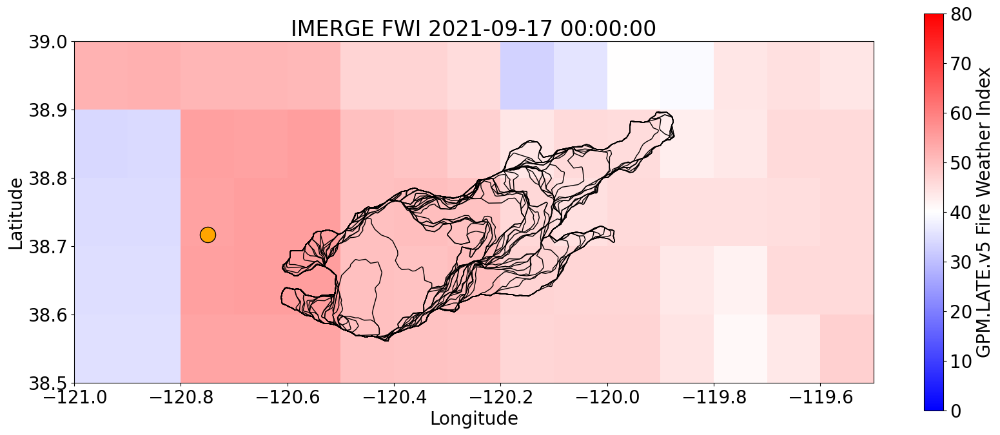

48


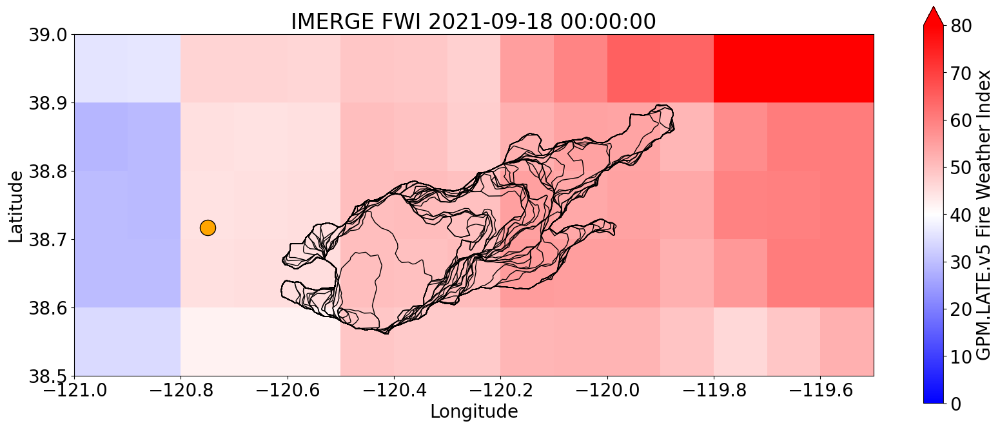

49


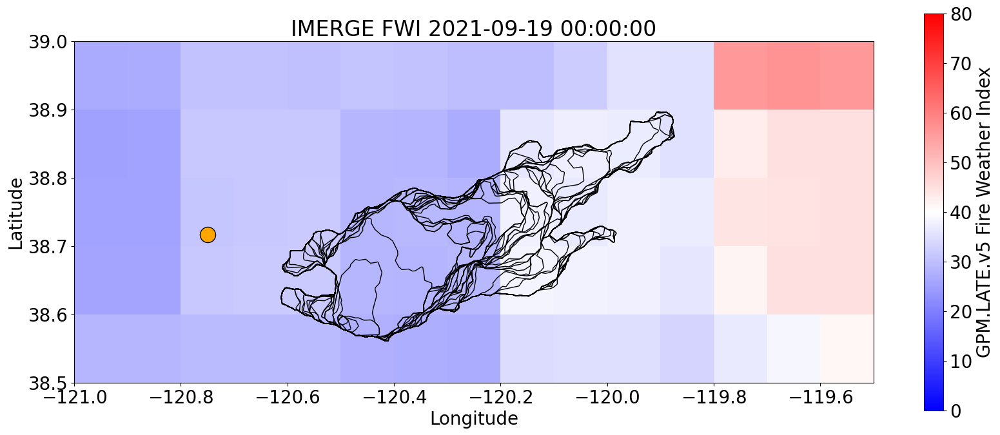

50


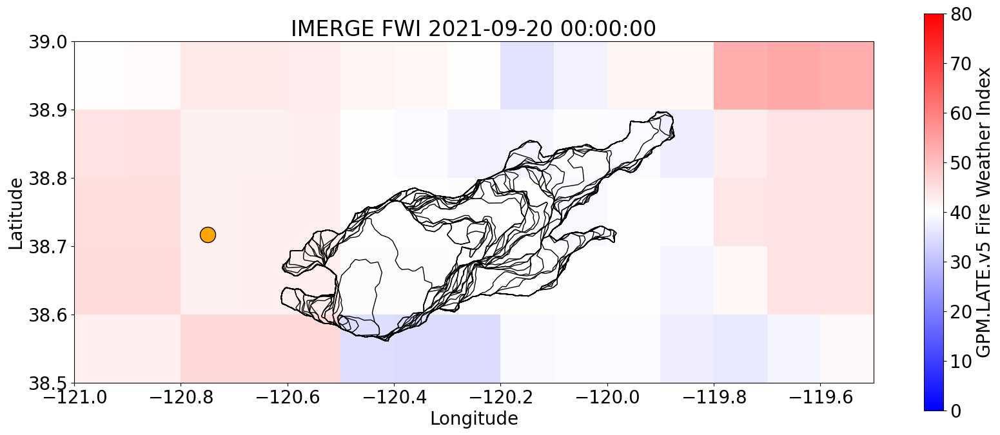

51


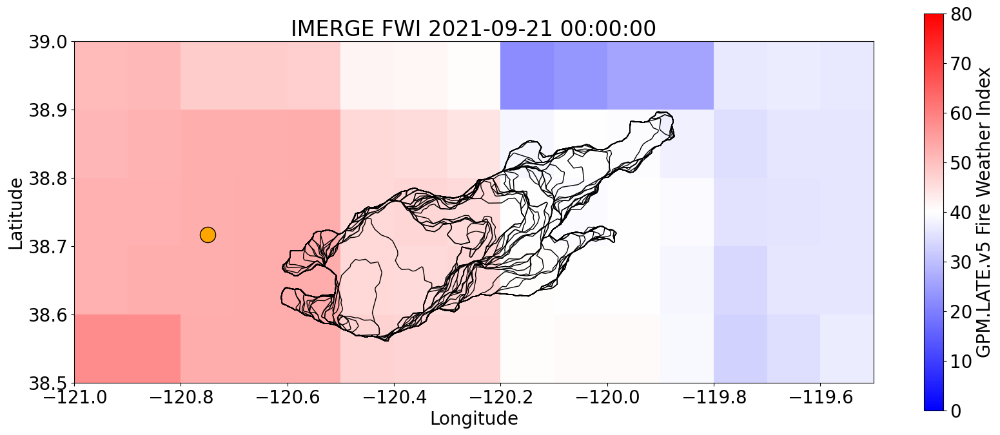

52


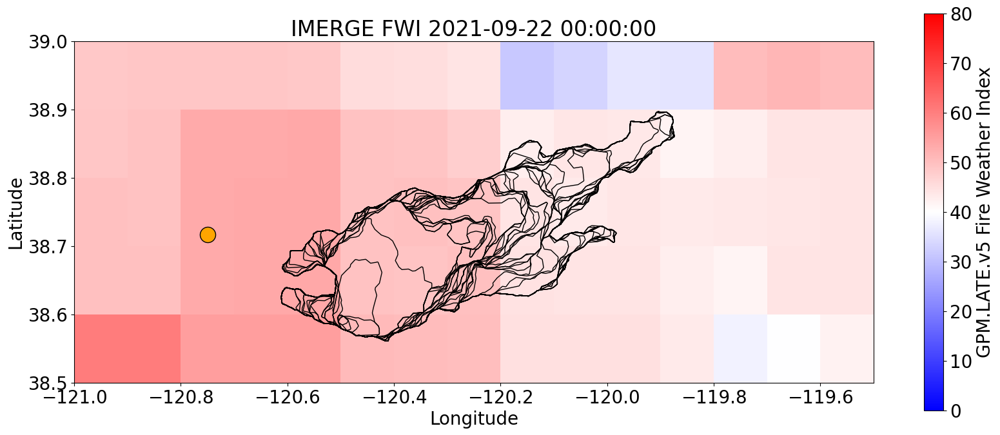

53


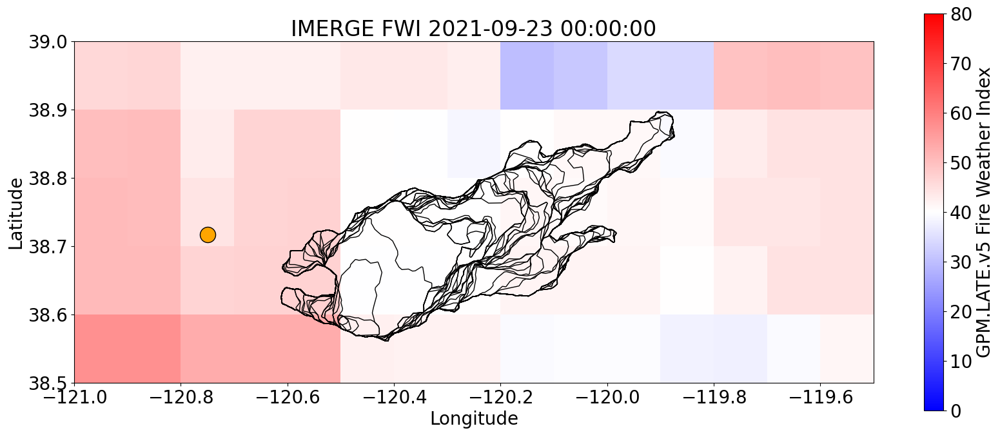

54


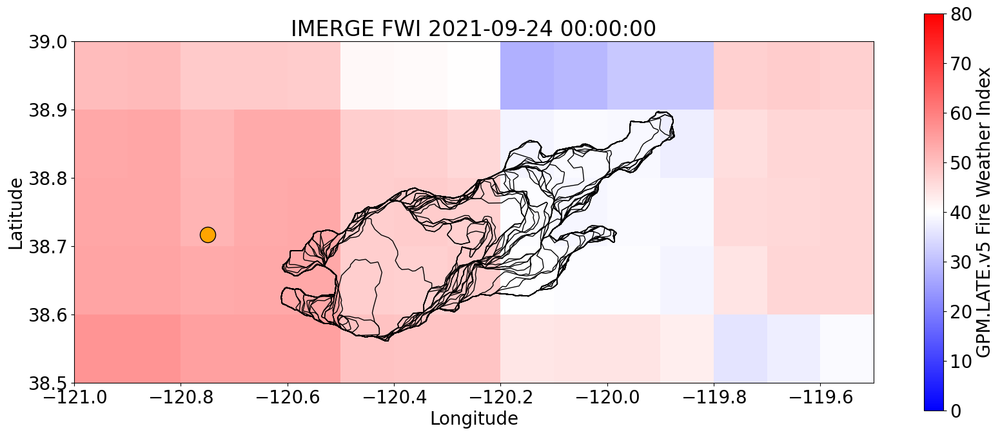

55


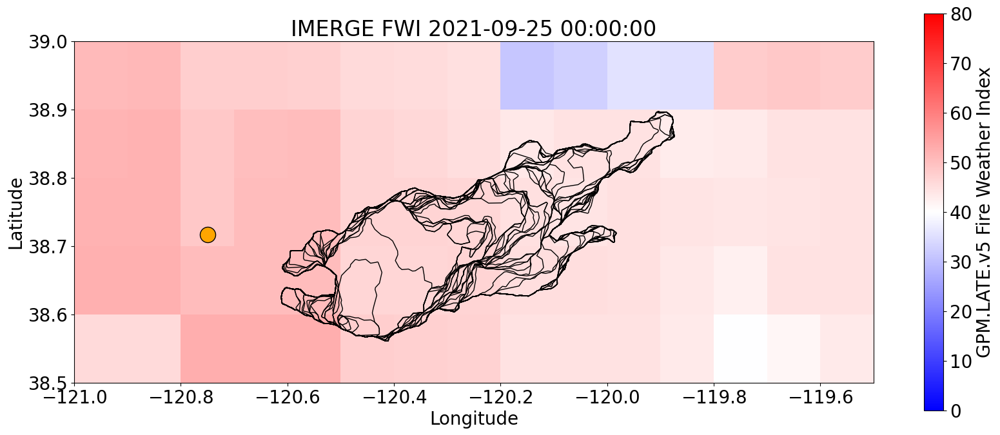

56


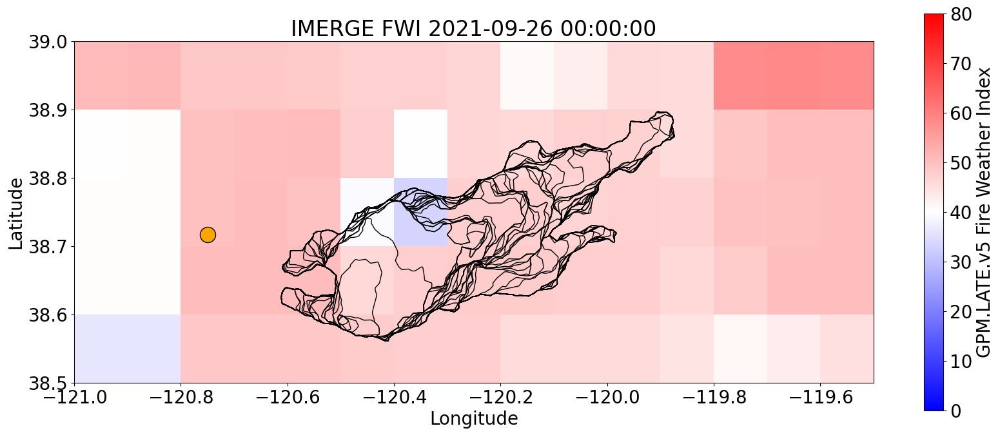

57


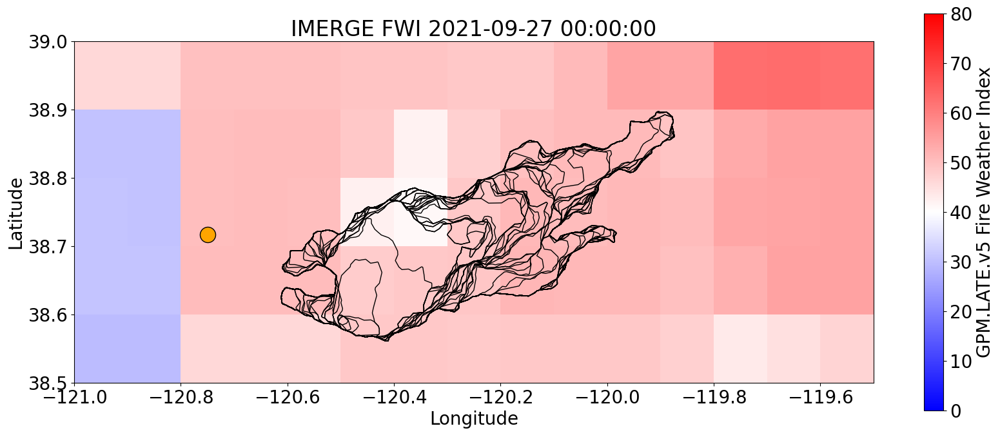

58


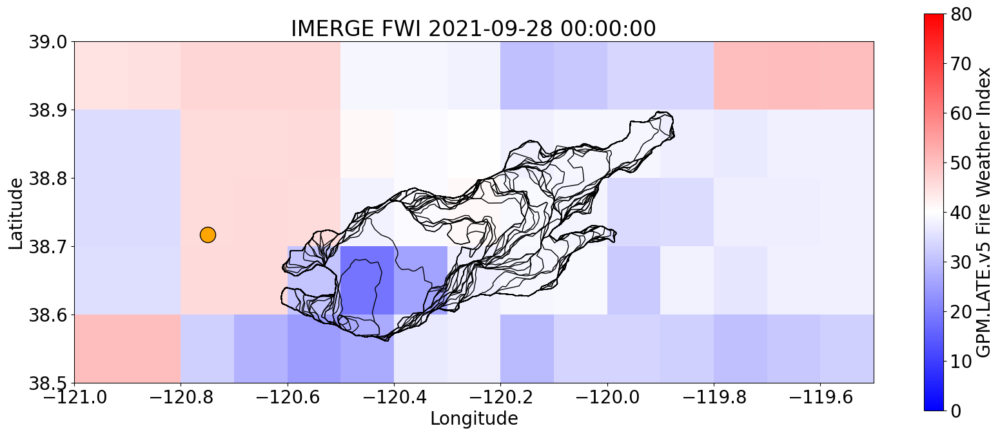

59


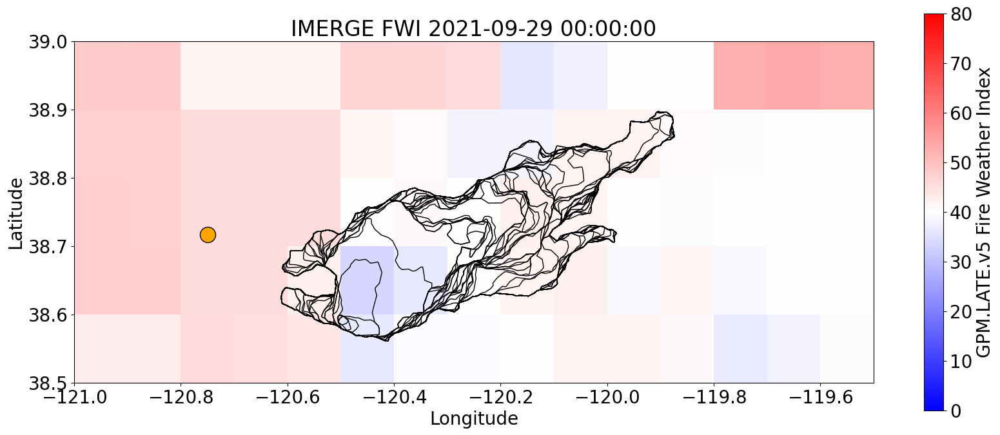

60


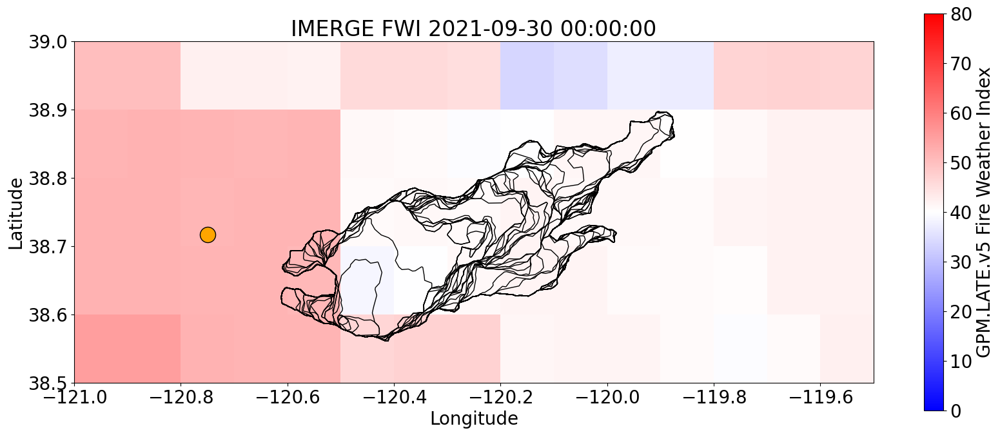

In [47]:
len_days = len(date_df.dates_fl)

for i in range(1, len_days):
    print(i)
    ## Static Plot with Doug's feedback
    f, (ax) = plt.subplots(1, figsize=(20,8))
    params = {"text.color" : "black",
              "font.size": 20, 
          "xtick.color" : "black",
          "ytick.color" : "black"}
    plt.rcParams.update(params)
        ## Adding the raster
    #root_moist = xr.open_rasterio("s3://veda-data-store-staging/EIS/COG/LIS_FORC_FWI_WEST_US/FWI/LIS_FWI_COMP_20UTC_" + date_df.dates_fl[i] +"0000.d01.FWI.cog")
    #subset = root_moist.rio.clip_box(minx=min_lon, miny=min_lat, maxx=max_lon, maxy=max_lat)
    #subset.plot(ax = ax3, cmap = "bwr", vmin = 0, vmax = 100, label = "LIS FWI")
    #ax.set_xlable("Longitude")
    #ax.xlable("Longitude")
    #sub_plot = ax.plot(subset, cmap = "bwr_r", vmin= 1, vmax = 1)
    #if(i <= 6):

    #gdf[d0:i].plot(ax=ax3, facecolor="none", edgecolor='none')
    
    #if(i > 6):
    #    index = i - 6
    #    gdf[d0:index].plot(ax=ax3, facecolor="yellow", edgecolor='black') #facecolor="None"
    #ax.xlable("Longitude")
    #ax3.set_ylabel("Latitude", color = "black")
    #ax3.set_xlabel("Longitude", color = "black")
    #ax3.set_title(("LIS FWI" + str(date_df.dates_clean[i]) ), color = "black")

    #if(i < 10):
    #    i_write = "0" + str(i)
    #else:
    #    i_write = str(i)

    gsmall.sel(time = date_df.dates_clean[i]).plot(ax = ax, cmap = "bwr", vmin = 0,vmax = 80, label = " ")
    gdf[d0:i].plot(ax=ax, facecolor="none", edgecolor='none')
    ax.set_title(("IMERGE FWI" +" " +  str(date_df.dates_clean[i])))
    ax.set_ylabel("Latitude", color = "black")
    ax.set_xlabel("Longitude", color = "black")
    ax.scatter(y = 38.717, x = -120.75, color = "orange", s = 300, edgecolors= "black")
    params = {"text.color" : "black",
              "font.size": 20, 
          "xtick.color" : "black",
          "ytick.color" : "black"}
    plt.rcParams.update(params)
    
    if(i > 6):
        index = i - 6
        gdf[d0:index].plot(ax=ax, facecolor="none", edgecolor='black') #facecolor="None"
        
    if(i < 10):
       i_write = "0" + str(i)
    else:
       i_write = str(i)

    ## The save statement
    plt.savefig('/projects/my-public-bucket/fire_weather_vis/base-fwi-vis/LIS_visualize/imerge_caldor/FWI_Caldor_'+ i_write +'.png', dpi = 200)
    plt.show()

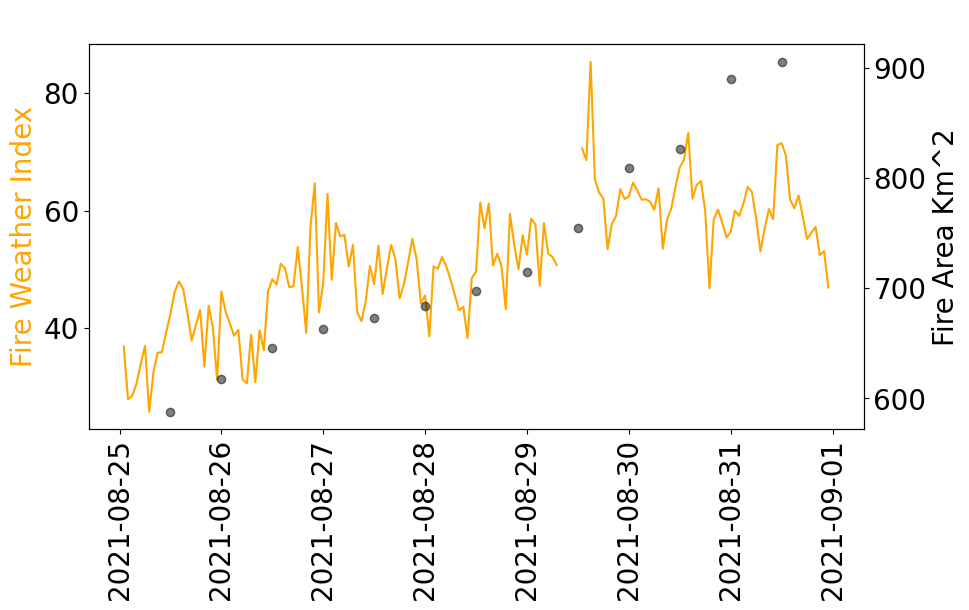

In [48]:
## Zoom in for diurnal cycle

full_fr = full_fr[full_fr.t < "2021-09-01"]
full_fr = full_fr[full_fr.t > "2021-08-25"]

## All timeseries on one plot
f, (ax) = plt.subplots(1, figsize=(10,5))

ax.plot(full_fr.t, full_fr.FWI, color = "orange", label = "Placerville Airport Weather Station" )  # c = full_fr.FWI, cmap = "bwr", vmin = 0, vmax = 100
#ax.plot(date_df.dates_clean, date_df.fwi_list, color = "purple", label = "LIS")
#gsmaller.sel(time = slice("2021-08-25", "2021-09-01")).plot(color = "green", label = "IMERGE FWI")
ax.set_title(" ")
ax.tick_params(axis='x', labelrotation = 90)
ax2 = ax.twinx()
ax2.scatter(full_fr.t, full_fr.farea, color = "black", label = "Fire Area", alpha = 0.5)
ax2.set_ylabel("Fire Area Km^2")
ax.set_ylabel("Fire Weather Index",color="orange")
#ax.legend(loc = 'upper left')
plt.savefig('/projects/my-public-bucket/fire_weather_vis/base-fwi-vis/LIS_visualize/FWI_Caldor_Imerge.png', dpi = 450)
